# Introduction


Toxicity is a major problem in online communities. It is important to be able to detect toxic comments and take action to prevent them. In this project, we will be using a dataset of comments from Wikipedia’s talk page edits. The dataset contains comments labeled as toxic or non-toxic. We will be using this dataset to train a model that can predict whether a comment is toxic or not.


# Data Exploration and EDA


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import pickle

color_pal = sns.color_palette('muted')
plt.style.use('tableau-colorblind10')

import re
import contractions
import string
# from textblob import TextBlob

import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk.stem import WordNetLemmatizer

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

%matplotlib inline

In [ ]:
# Read in the data
df_train = pd.read_csv("../data/train.csv")


In [ ]:
df_train.tail()

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
159566,ffe987279560d7ff,""":::::And for the second time of asking, when ...",0,0,0,0,0,0
159567,ffea4adeee384e90,You should be ashamed of yourself \n\nThat is ...,0,0,0,0,0,0
159568,ffee36eab5c267c9,"Spitzer \n\nUmm, theres no actual article for ...",0,0,0,0,0,0
159569,fff125370e4aaaf3,And it looks like it was actually you who put ...,0,0,0,0,0,0
159570,fff46fc426af1f9a,"""\nAnd ... I really don't think you understand...",0,0,0,0,0,0


In [ ]:
df_train.shape

(159571, 8)

In [ ]:
# ax = (
#     df_train[df_train.columns[2:].tolist()]
#     .value_counts()
#     .sort_values(ascending=True)
#     .plot(kind="barh", figsize=(10, 10))
# )
# ax.bar_label(ax.containers[0])

# plt.show()

# # for _ in df_train.columns[2:].tolist():
# #     df_train[_].value_counts().plot(kind='bar')


In [ ]:
# Checking of null values
df_train.isnull().sum()

id               0
comment_text     0
toxic            0
severe_toxic     0
obscene          0
threat           0
insult           0
identity_hate    0
dtype: int64

In [ ]:
# Checking of unique values
display(df_train["id"].nunique())
display(df_train["comment_text"].nunique())


159571

159571

Total number of rows = 159571
Total number of unique values in id = 159571
Total number of unique values in comment_text = 159571

As the above numbers are the same, each row has a unique id.


In [ ]:
with pd.option_context("display.max_colwidth", None):
    display(df_train.tail())


,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
159566,ffe987279560d7ff,""":::::And for the second time of asking, when your view completely contradicts the coverage in reliable sources, why should anyone care what you feel? You can't even give a consistent argument - is the opening only supposed to mention significant aspects, or the """"most significant"""" ones? \n\n""",0,0,0,0,0,0
159567,ffea4adeee384e90,You should be ashamed of yourself \n\nThat is a horrible thing you put on my talk page. 128.61.19.93,0,0,0,0,0,0
159568,ffee36eab5c267c9,"Spitzer \n\nUmm, theres no actual article for prostitution ring. - Crunch Captain.",0,0,0,0,0,0
159569,fff125370e4aaaf3,And it looks like it was actually you who put on the speedy to have the first version deleted now that I look at it.,0,0,0,0,0,0
159570,fff46fc426af1f9a,"""\nAnd ... I really don't think you understand. I came here and my idea was bad right away. What kind of community goes """"you have bad ideas"""" go away, instead of helping rewrite them. """,0,0,0,0,0,0


In [ ]:
df_train.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159571 entries, 0 to 159570
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   id             159571 non-null  object
 1   comment_text   159571 non-null  object
 2   toxic          159571 non-null  int64 
 3   severe_toxic   159571 non-null  int64 
 4   obscene        159571 non-null  int64 
 5   threat         159571 non-null  int64 
 6   insult         159571 non-null  int64 
 7   identity_hate  159571 non-null  int64 
dtypes: int64(6), object(2)
memory usage: 9.7+ MB


In [ ]:
df_train.columns[2:].tolist()

['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']

In [ ]:
# Looking at examples for each label

for c in df_train.columns[2:].tolist():
    print(f"{c}")
    with pd.option_context("display.max_colwidth", 100):
        display(df_train[df_train[c] == 1][['comment_text', 'toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']].sample(3))
    print("-" * 100)


toxic


,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
69348,Alrighty\n\nYou can go fuck yourself.,1,0,1,0,1,0
57814,Suck a dick you little cunt \n\nthen go and take your uncle deep up your tight little ass,1,0,1,0,1,0
34511,"""\n\n ................ \n\naww looks like someone forgot 2 say please\n\nand just who the hell a...",1,0,0,0,0,0


----------------------------------------------------------------------------------------------------
severe_toxic


,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
134145,==\n\nFuck you. Fuck everyone on this site. You are all fucking gay tossers,1,1,1,0,1,1
158498,n ig ger nig ger \n\nHi n i g g e r,1,1,1,0,0,1
49225,Mattythewhite is a bitchMattythewhite is a bitchMattythewhite is a bitchMattythewhite is a bitch...,1,1,1,0,1,0


----------------------------------------------------------------------------------------------------
obscene


,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
4840,YO B1TCH! \n\nyou absolute fuk1ng little b1tch you wanna step up face to face toe to toe you fuk...,1,1,1,0,1,0
144954,"In addition, I see no sock puppet, jackass.",1,0,1,0,1,0
140233,"its an AP article you asshole, how is it not neutral???",1,0,1,0,1,0


----------------------------------------------------------------------------------------------------
threat


,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
155722,COME DUCT-TAKE YOU AND RAPE YOU TILL YOU DIE FUCKHEAD,1,1,1,1,1,0
105677,"WHO ARE YOU FUCKING CUNT HEADS TO TELL ME THAT I AM NOT WELCOME HERE? GO FUCKING DIE, TWICE. YOU...",1,0,1,1,1,0
36710,"yo, as*hole \n\nim gonna kill you and steal ur huge monitor!",1,0,1,1,1,0


----------------------------------------------------------------------------------------------------
insult


,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
78677,How about you all go fuck yourselves?,1,0,1,0,1,0
145466,Knob Jockey \n\nYour a fruit for deleting my Page Ass,1,0,1,0,1,0
3890,Well well well \nYou've just done the most stupid thing saying we have always been enemies. Now ...,1,0,1,0,1,0


----------------------------------------------------------------------------------------------------
identity_hate


,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
16390,"hey \n\nhey faggot, are you dead? or are you watching your mom getting raped by islamic terrorists?",1,1,1,0,1,1
82920,"YO\n\nI don't appreciate you pushing me as a black person fool! Get off my nuts, stop acting lik...",1,0,1,0,1,1
125806,GAY..... \n\nI THINK YOUR REALLY REALLY GAY AND YOU PROBABLY SUCK DICK FIND SOMETHING BETTER TO ...,1,1,1,0,1,1


----------------------------------------------------------------------------------------------------


In [ ]:
df_train_x = df_train.copy()

df_train_x["total"] = df_train_x[df_train_x.columns[2:].tolist()].sum(axis=1)

df_train_x.query("total > 0")

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,total
6,0002bcb3da6cb337,COCKSUCKER BEFORE YOU PISS AROUND ON MY WORK,1,1,1,0,1,0,4
12,0005c987bdfc9d4b,Hey... what is it..\n@ | talk .\nWhat is it......,1,0,0,0,0,0,1
16,0007e25b2121310b,"Bye! \n\nDon't look, come or think of comming ...",1,0,0,0,0,0,1
42,001810bf8c45bf5f,You are gay or antisemmitian? \n\nArchangel WH...,1,0,1,0,1,1,4
43,00190820581d90ce,"FUCK YOUR FILTHY MOTHER IN THE ASS, DRY!",1,0,1,0,1,0,3
...,...,...,...,...,...,...,...,...,...
159494,fef4cf7ba0012866,"""\n\n our previous conversation \n\nyou fuckin...",1,0,1,0,1,1,4
159514,ff39a2895fc3b40e,YOU ARE A MISCHIEVIOUS PUBIC HAIR,1,0,0,0,1,0,2
159541,ffa33d3122b599d6,Your absurd edits \n\nYour absurd edits on gre...,1,0,1,0,1,0,3
159546,ffb47123b2d82762,"""\n\nHey listen don't you ever!!!! Delete my e...",1,0,0,0,1,0,2


From the simple analysis of the dataset, it can be observed that most of the comments that are negative, seems to categorized to the feature based on human intituition. This results in the data being dependent on the humans who did this data labeling, and may lead to bias in the model.


# EDA


## Target Variables Exploration


In [ ]:
# Adding in the non-toxic column for EDA purposes to look at the overall distribution of comments

# Create a copy of the dataframe
df_train_negative = df_train.copy()

# Create a new column called non-toxic for EDA
df_train_negative["negative_sum"] = (
    df_train_negative[df_train.columns[2:].tolist()]
    .sum(axis=1)
    .apply(lambda x: 1 if x > 0 else 0)
)


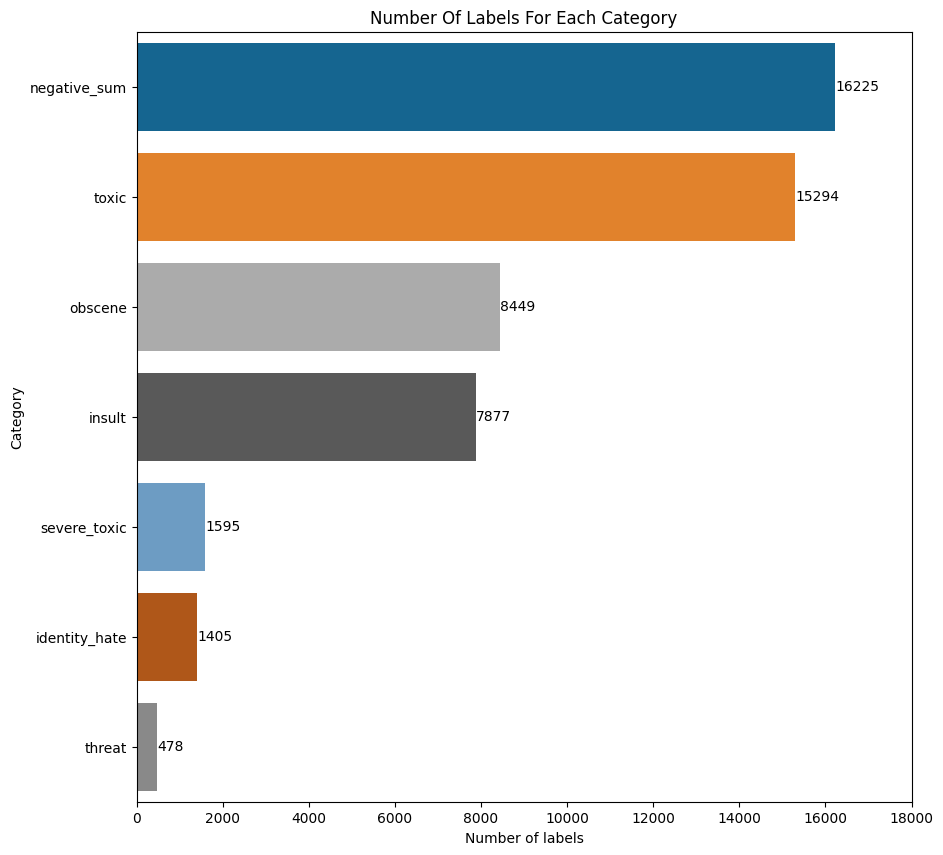

In [ ]:
# Plot of number of comments for each label
plt.figure(figsize=(10, 10))

ax = sns.barplot(
    data=df_train_negative[df_train_negative.columns[2:].tolist()]
    .sum()
    .sort_values(ascending=False)
    .reset_index(),
    x=0,
    y="index",
    orient="h",
)

ax.bar_label(ax.containers[0])

plt.xlim(0, 18000)
plt.title("Number of Labels for each category".title())
plt.xlabel("Number of labels")
plt.ylabel("Category")
plt.savefig("../charts/plots/labels_per_category.png", bbox_inches="tight")
plt.show()


In [ ]:
# Checking for data imbalance

df_train_negative["negative_sum"].value_counts(normalize=True)


0    0.898321
1    0.101679
Name: negative_sum, dtype: float64

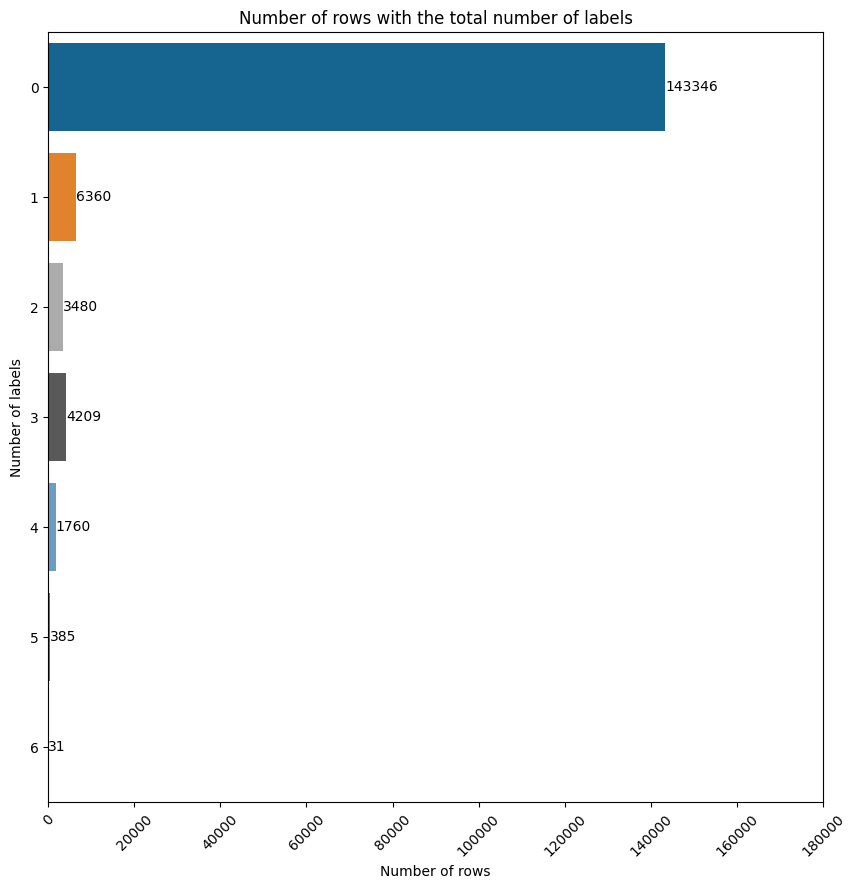

In [ ]:
# Find the number of total counts of of each label for each row
plt.figure(figsize=(10, 10))
ax = sns.barplot(
    data=df_train[df_train.columns[2:].tolist()]
    .sum(axis=1)
    .value_counts(ascending=True)
    .reset_index(),
    x=0,
    y="index",
    orient="h",
)

ax.bar_label(ax.containers[0])

plt.xlim(0, 180000)
plt.xticks(rotation=45)
plt.title("Number of rows with the total number of labels")
plt.xlabel("Number of rows")
plt.ylabel("Number of labels")

plt.savefig("../charts/plots/number_of_rows_with_total_number_of_labels.png")
plt.show()

- About 10 percent of the data is toxic, the data is imbalanced
- We can also see that most of the toxic data has only one label, with the least having all 6 labels.
- Furthermore, a lot of the toxic data are classified as toxic, with threat being the least.

## Correlation Plot


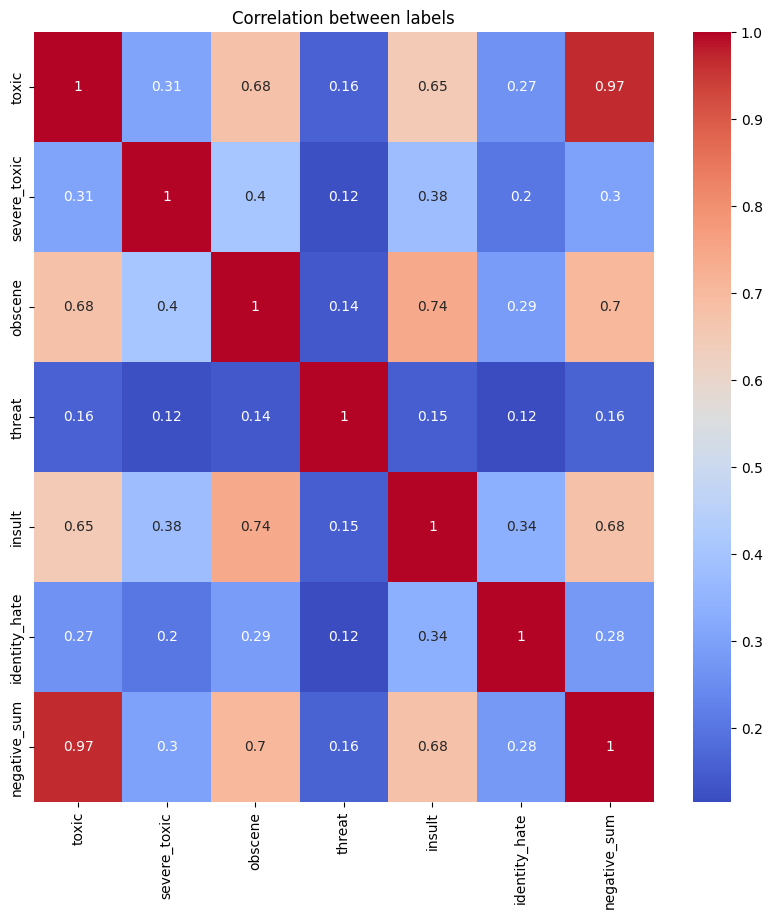

In [ ]:
plt.figure(figsize=(10, 10))

sns.heatmap(df_train_negative.corr(), annot=True, cmap="coolwarm")

plt.title("Correlation between labels")
plt.savefig("../charts/plots/correlation_between_labels.png")
plt.show()

In [ ]:
# Usage of crosstab to check for correlation between the labels

# matrix_all = pd.DataFrame()
# for c in df_train_negative.columns[3:]:
#     matrix = pd.crosstab(df_train["toxic"], df_train[c])
#     display(matrix)


- The correlation plot shows that most of the toxic comments consists of most of the negative_sum data, which means that most of the comments that are toxic, are just toxic in general.
- We can also see that most of the toxic comments are obscene and insultive in nature, which is quite expected, especially in the usage of f-words.

## Word Clouds

In [ ]:
# Word clouds

from wordcloud import WordCloud, STOPWORDS

stopwords = set(STOPWORDS)


In [ ]:
def show_wordcloud(feature, feature_title=None, pic=None, feature_label=1):
    """
    Function to create word clouds, and to input pictures
    """

    py_words = WordCloud(
        background_color="white",
        stopwords=stopwords,
        max_words=200,
        mask=pic,
    )

    py_words.generate(
        df_train_negative.loc[df_train_negative[feature] == feature_label, "comment_text"].str.cat(
            sep=" "
        )
    )

    plt.figure(figsize=(20, 10))
    plt.imshow(py_words, interpolation="bilinear")
    plt.axis("off")

    if feature_title is not None:
        plt.title(f"Word Cloud for {feature_title.title()} Comments", fontsize=20)
        plt.savefig(f"../charts/wordcloud/{feature_title.title()}_wordcloud.png", bbox_inches="tight", facecolor='w')
        
    else:
        plt.title(f"Word Cloud for {feature.title()} Comments", fontsize=20)
        plt.savefig(f"../charts/wordcloud/{feature.title()}_wordcloud.png", bbox_inches="tight", facecolor='w', dpi=300)

    plt.show()


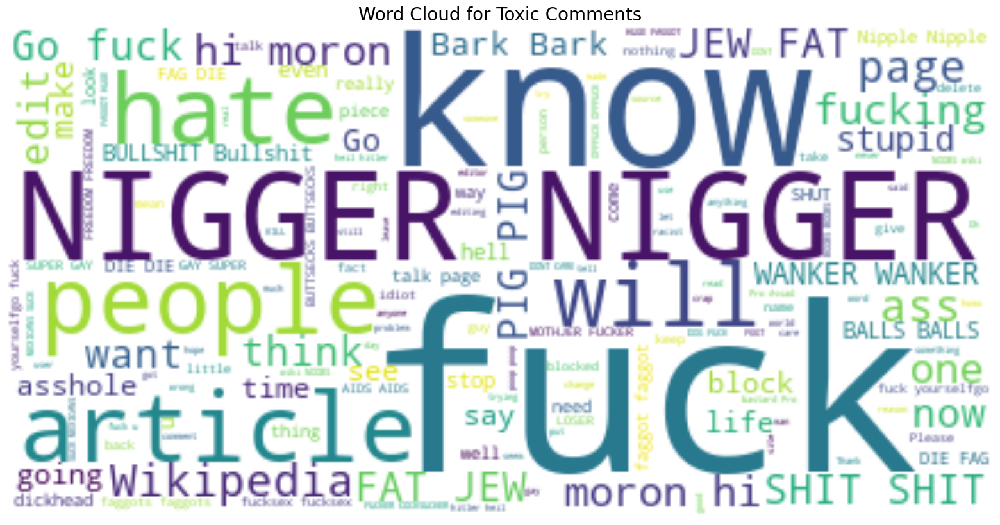

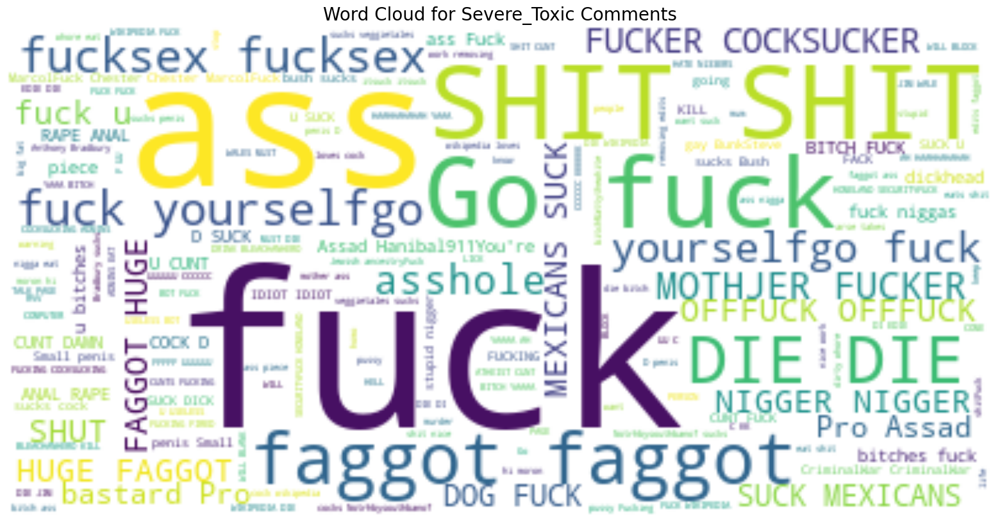

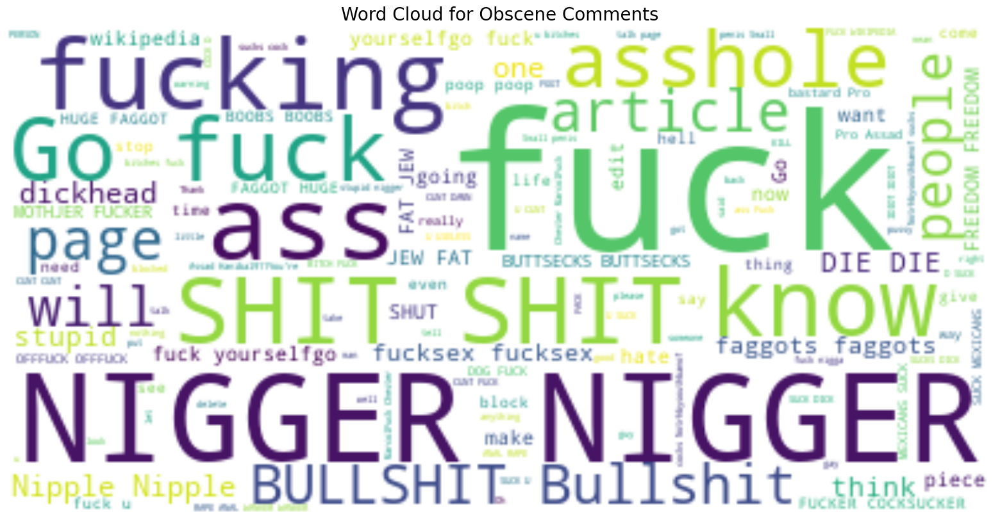

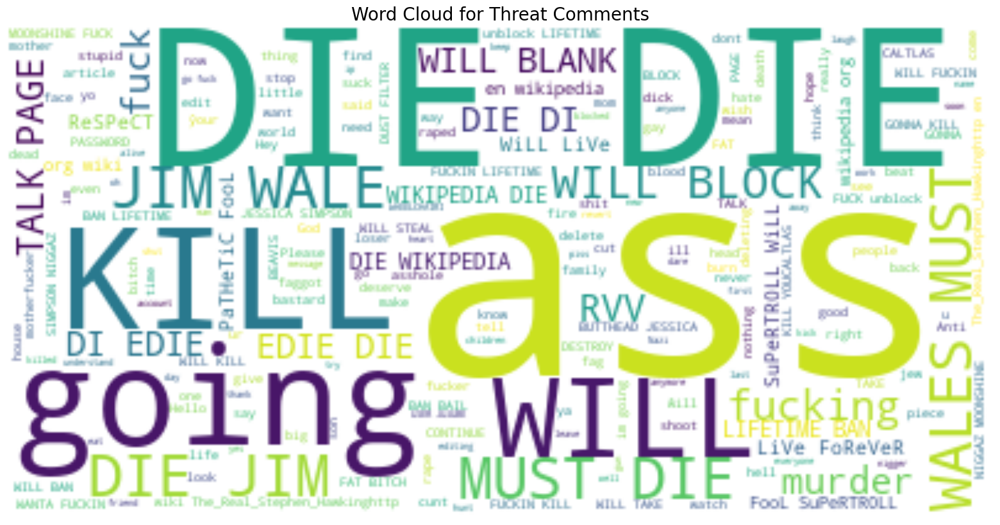

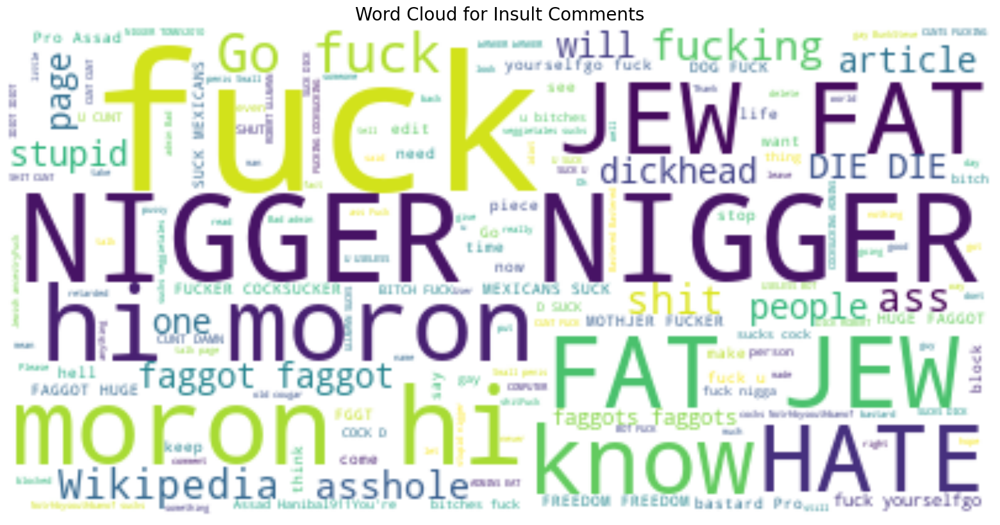

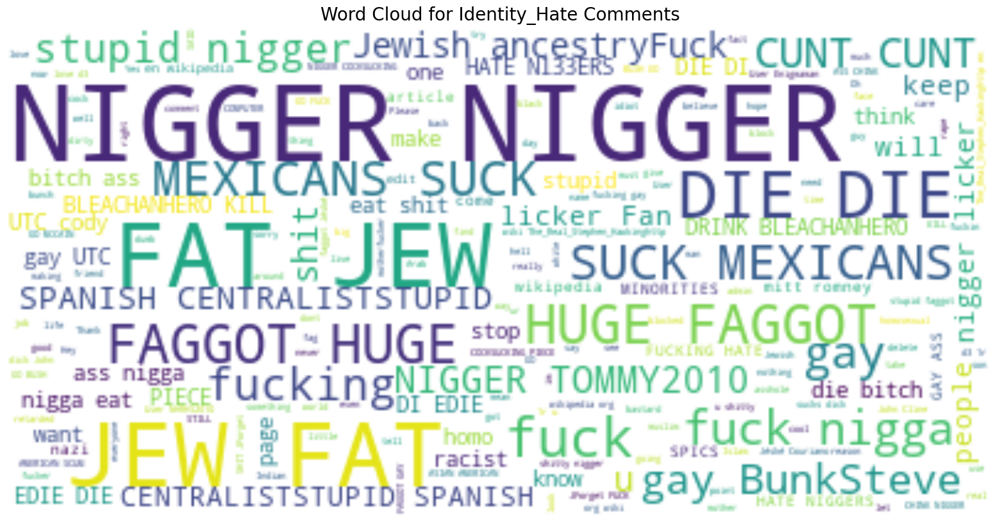

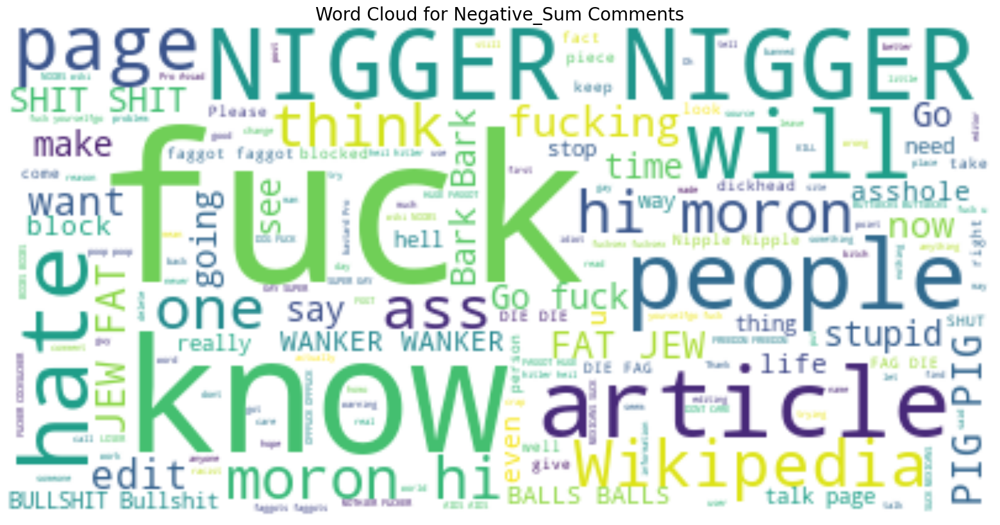

In [ ]:
for c in df_train_negative.columns[2:].tolist():
    show_wordcloud(c)

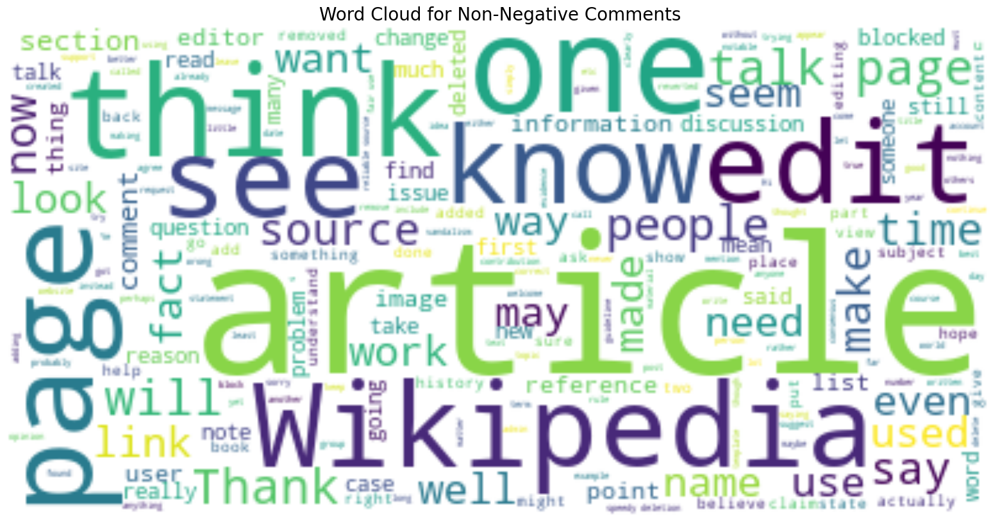

In [ ]:
show_wordcloud("negative_sum", feature_title="non-negative", pic=None, feature_label=0)

## Adding of more features for further EDA


In [ ]:
# with pd.option_context('display.max_colwidth',None):
#     display(df_train_nontoxic['comment_text'].str.replace('\d+', '', regex=True))

In [ ]:
# # Number of sentences for each comment
# df_train_nontoxic['sentence_count'] = df_train_nontoxic['comment_text'].str.replace('\d+', '', regex=True).apply(lambda x: len(re.split(r'[.!?\n]+', str(x))))

In [ ]:
# with pd.option_context('display.max_colwidth',None):
#     display(df_train_nontoxic['comment_text'].head())

In [ ]:
# df_train_nontoxic.head()

In [ ]:
# Word count for each comment
df_train_negative["word_count"] = df_train_negative["comment_text"].apply(
    lambda x: len(str(x).split())
)

# Unique word count for each comment
df_train_negative["unique_word_count"] = df_train_negative["comment_text"].apply(
    lambda x: len(set(str(x).split()))
)

# Upper case word count for each comment
df_train_negative["upper_case_word_count"] = df_train_negative["comment_text"].apply(
    lambda x: len([w for w in str(x).split() if w.isupper()])
)

# Stop word count for each comment
df_train_negative["stop_word_count"] = df_train_negative["comment_text"].apply(
    lambda x: len([w for w in str(x).lower().split() if w in stopwords])
)

# Punctuation count for each comment
df_train_negative["punctuation_count"] = df_train_negative["comment_text"].apply(
    lambda x: len([c for c in str(x) if c in string.punctuation])
)

# Title word count for each comment
df_train_negative["title_word_count"] = df_train_negative["comment_text"].apply(
    lambda x: len([w for w in str(x).split() if w.istitle()])
)

# Number of sentences for each comment
df_train_negative["sentence_count"] = (
    df_train_negative["comment_text"]
    .str.replace("\d+", "", regex=True)
    .apply(lambda x: len(re.split(r"[.!?\n]+", str(x))))
)

# Percent of word count in each comment
df_train_negative["percent_unique_word_count"] = (
    df_train_negative["unique_word_count"] / df_train_negative["word_count"] * 100
)

# Percent of upper case word count in each comment
df_train_negative["percent_upper_case_word_count"] = (
    df_train_negative["upper_case_word_count"] / df_train_negative["word_count"] * 100
)

# Percent of punctuation count in each comment
df_train_negative["percent_punctuation_count"] = (
    df_train_negative["punctuation_count"] / df_train_negative["word_count"] * 100
)

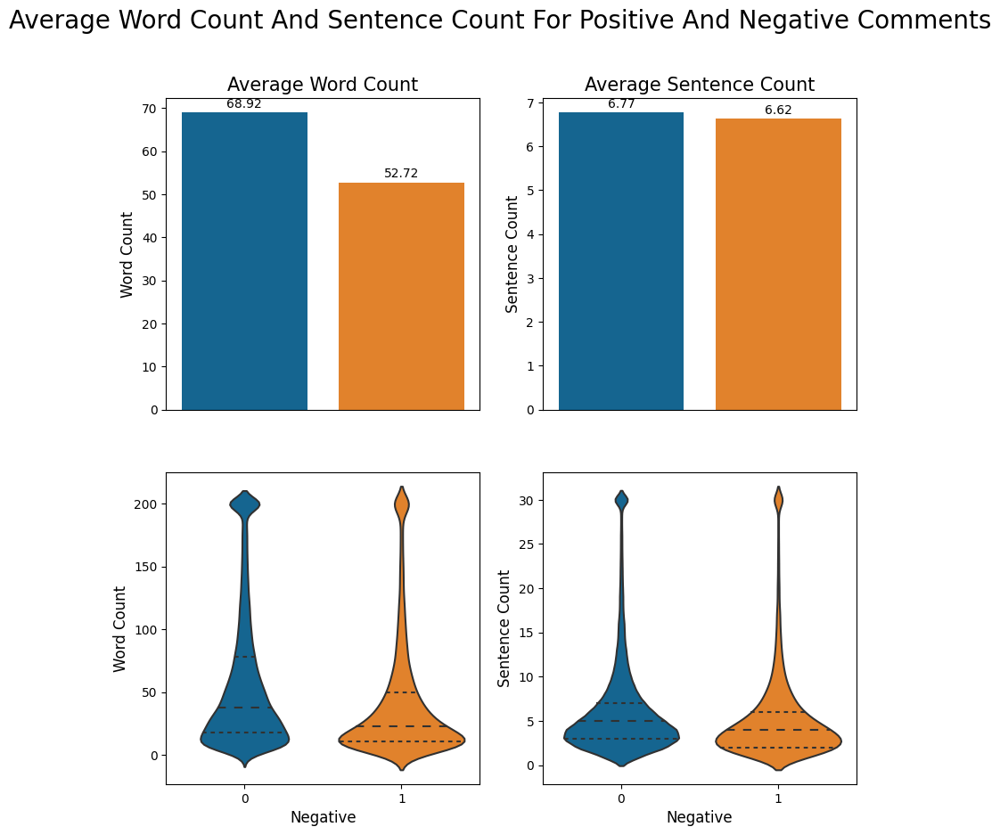

In [ ]:
# Length of comment vs toxicity - Violin plot

# Copy of the dataframe
temp_df = df_train_negative.copy()

# Change the count of words above 200 to be 200 - and assign it to temp_df
temp_df.loc[temp_df["word_count"] > 200, "word_count"] = 200
temp_df.loc[temp_df["sentence_count"] > 30, "sentence_count"] = 30

# Set up plot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

plt.suptitle("average word count and sentence count for positive and negative comments".title(), fontsize=20)

# Plot 1 - Word count
axes[0, 0] = sns.barplot(
    data=df_train_negative,
    x="negative_sum",
    y="word_count",
    ax=axes[0, 0],
    ci=None,
)
axes[0, 0].set_title("Average Word Count", fontsize=15)
axes[0, 0].set_xlabel("Negative", fontsize=12)
axes[0, 0].get_xaxis().set_visible(False)
axes[0, 0].set_ylabel("Word Count", fontsize=12)
axes[0,0].bar_label(axes[0,0].containers[0], fmt='%.2f', padding=2)

# Plot 2 - Word count - violin plot
axes[1, 0] = sns.violinplot(
    data=temp_df,
    x="negative_sum",
    y="word_count",
    ax=axes[1, 0],
    inner="quartile",
)
# axes[1, 0].set_title("Word Count", fontsize=15)
axes[1, 0].set_xlabel("Negative", fontsize=12)
axes[1, 0].set_ylabel("Word Count", fontsize=12)

# Plot 3 - Sentence count
axes[0, 1] = sns.barplot(
    data=df_train_negative, x="negative_sum", y="sentence_count", ax=axes[0, 1], ci=None
)

axes[0, 1].set_title("Average Sentence Count", fontsize=15)
axes[0, 1].set_xlabel("Negative", fontsize=12)
axes[0, 1].get_xaxis().set_visible(False)
axes[0, 1].set_ylabel("Sentence Count".title(), fontsize=12)
axes[0,1].bar_label(axes[0,1].containers[0], padding=2, fmt='%.2f')

# Plot 4 - Sentence count - violin plot
axes[1, 1] = sns.violinplot(
    data=temp_df,
    x="negative_sum",
    y="sentence_count",
    ax=axes[1, 1],
    inner="quartile",
)

axes[1, 1].set_ylabel("Sentence Count", fontsize=12)
axes[1, 1].set_xlabel("Negative", fontsize=12)


plt.savefig("../charts/plots/length_of_comment_vs_negative.png", bbox_inches="tight")
plt.show()

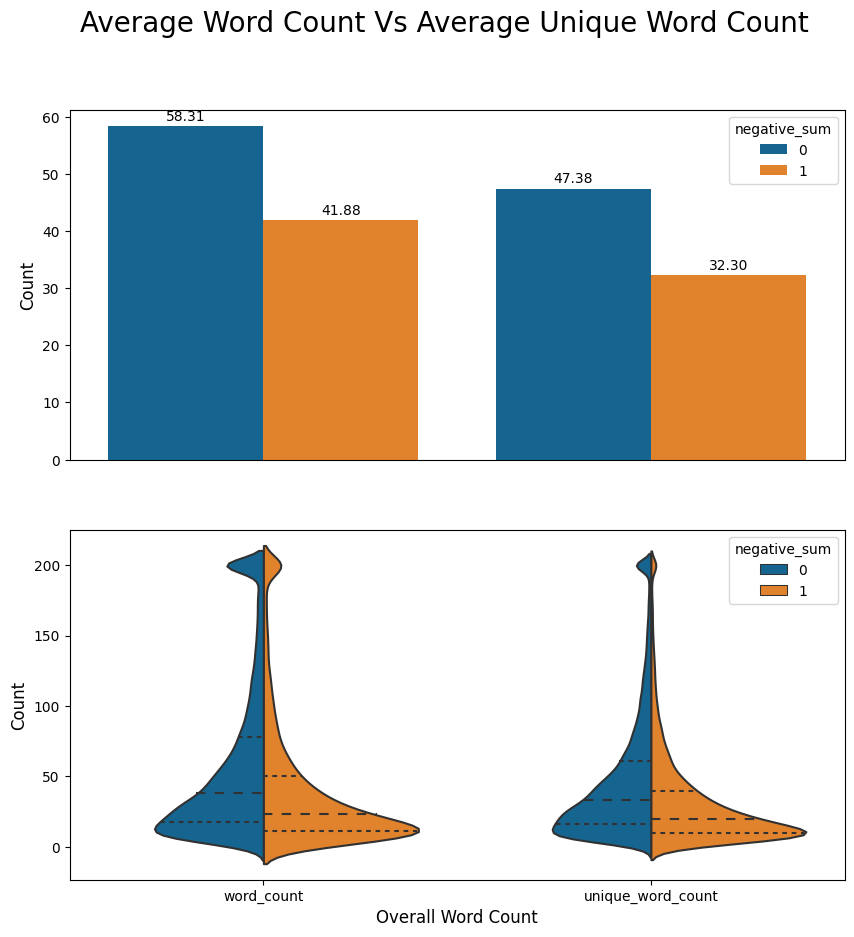

In [ ]:
# Unique word count vs word count - violin plot
temp_df = df_train_negative.copy()
temp_df.loc[temp_df["unique_word_count"] > 200, "unique_word_count"] = 200
temp_df.loc[temp_df["word_count"] > 200, "word_count"] = 200

temp_df = pd.melt(
    temp_df, value_vars=["word_count", "unique_word_count"], id_vars="negative_sum"
)
# display(temp_df.head())

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))

plt.suptitle("Average Word Count vs Average unique Word Count".title(), fontsize=20)
axes[0] = sns.barplot(
    data=temp_df, x="variable", y="value", hue="negative_sum", ax=axes[0], ci=None
)

axes[0].set_ylabel("Count", fontsize=12)
# axes[0].set_xticks(['word count', 'unquie word count'])
axes[0].get_xaxis().set_visible(False)
axes[0].bar_label(axes[0].containers[0], fmt='%.2f', padding=2)
axes[0].bar_label(axes[0].containers[1], fmt='%.2f', padding=2)


axes[1] = sns.violinplot(
    data=temp_df,
    x="variable",
    y="value",
    hue="negative_sum",
    split=True,
    inner="quartile",
    ax=axes[1],
)

axes[1].set_ylabel("Count", fontsize=12)
axes[1].set_xlabel("Overall Word Count", fontsize=12)

plt.savefig("../charts/plots/uniqueness_of_comment_vs_negative.png", bbox_inches="tight")
plt.show()

In [ ]:
# # Length of comment vs toxicity - distribution plot

# # Copy of the dataframe
# df_1 = df_train_negative.copy()

# # Change the count of words above 200 to be 200
# # df_1.loc[df_1['word_count'] > 200, 'word_count'] = 200
# # df_1.loc[df_1['sentence_count'] > 30, 'sentence_count'] = 30

# # fig, axes = plt.subplots(nrows=1,ncols=2, figsize=(10, 6))
# fig = plt.figure(figsize=(5, 5))

# sns.displot(
#     data=df_1,
#     x="word_count",
#     hue="negative_sum",
#     kde=True,
#     bins=50,
#     color=color_pal,
# )
# # axes[0] = sns.histplot(
# #     data=df_1,
# #     x="non_toxic",
# #     y="sentence_count",
# #     ax=axes[0]
# # )

# # axes[1] = sns.histplot(
# #     data=df_1,
# #     x="non_toxic",
# #     y="word_count",
# #     ax=axes[1]
# # )

# plt.show()

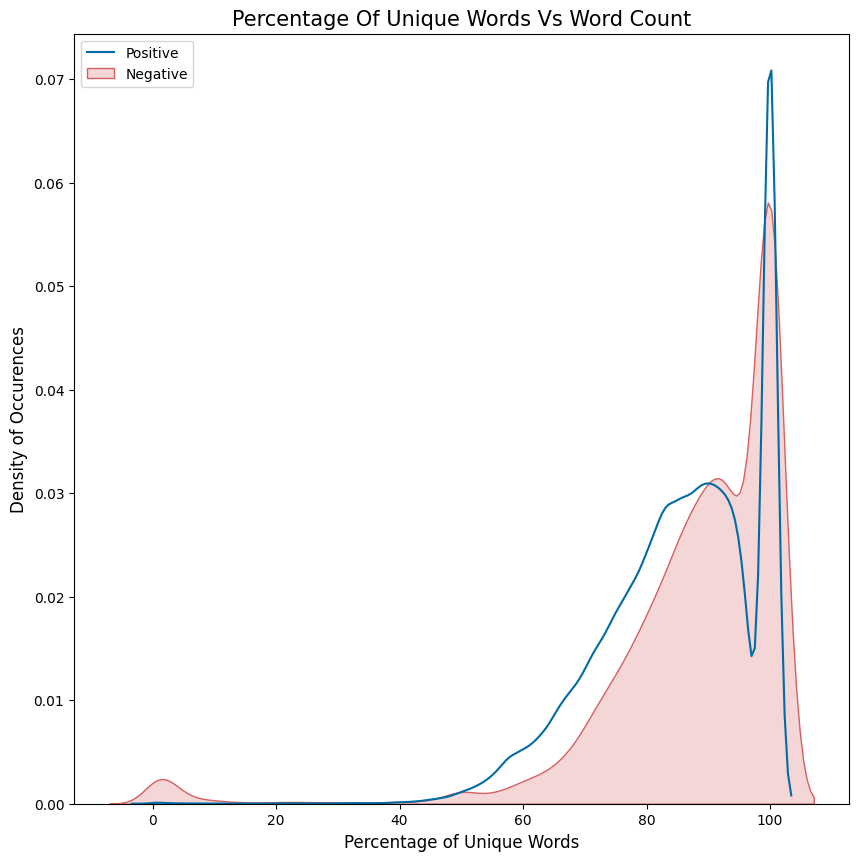

In [ ]:
# Percentage of unique words vs word count
# plt.figure(figsize=(5,5))
fig, ax = plt.subplots(figsize=(10, 10))

sns.kdeplot(
    data=df_train_negative.query("negative_sum == 0"),
    x="percent_unique_word_count",
    ax=ax,
    label="Positive",
    # color=color_pal[0]
)

sns.kdeplot(
    data=df_train_negative.query("negative_sum == 1"),
    x="percent_unique_word_count",
    shade=True,
    label="Negative",
    color=color_pal[3],
    ax=ax,
)

ax.legend()
plt.title("Percentage of Unique Words vs Word Count".title(), fontsize=15)
plt.xlabel("Percentage of Unique Words", fontsize=12)
plt.ylabel("Density of Occurences", fontsize=12)

plt.savefig("../charts/plots/percentage_of_unique_words_vs_word_count.png", bbox_inches="tight")
plt.show()


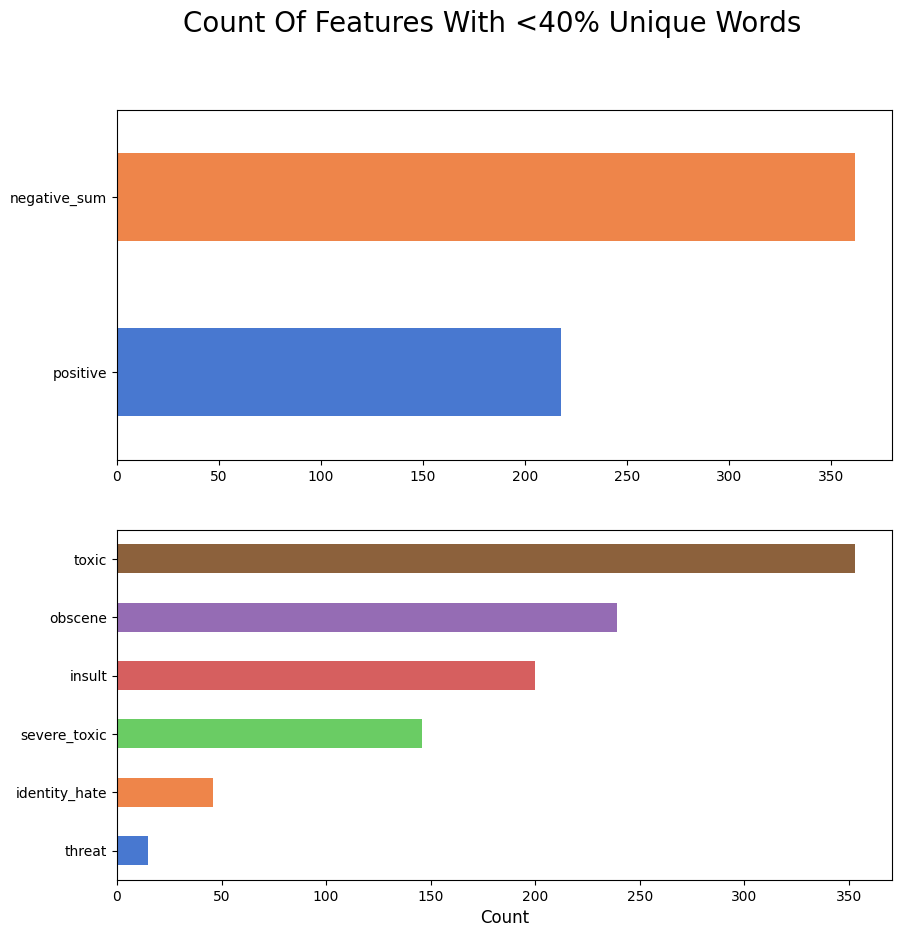

In [ ]:
# Plot of unique words for each feature

df_train_positive = df_train_negative.copy()
df_train_positive["positive"] = (
    df_train_negative[df_train_negative.columns[2:8].tolist()]
    .sum(axis=1)
    .apply(lambda x: 1 if x == 0 else 0)
)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10,10))
plt.suptitle("count of features with <40% unique words".title(), fontsize=20)
# plt.figure(figsize=(5, 5))
(
    df_train_positive.query("percent_unique_word_count < 40")
    .sum(axis=0)[
        [
            "negative_sum",
            "positive",
        ]
    ]
    .sort_values(ascending=True)
    .plot(kind="barh", color=color_pal, ax=axes[0])
)

(
    df_train_positive.query("percent_unique_word_count < 40")
    .sum(axis=0)[
        [
            "toxic",
            "severe_toxic",
            "obscene",
            "threat",
            "insult",
            "identity_hate",
        ]
    ]
    .sort_values(ascending=True)
    .plot(kind="barh", color=color_pal, ax=axes[1])
)

plt.xlabel("count".title(), fontsize=12)

plt.savefig("../charts/plots/count_of_features_with_less_than_40_percent_unique_words.png", bbox_inches="tight")
plt.show()

- From the chart above, it can be determined that there are alot of spammers for toxic words.
- Negative comments tend to have more than 40% unique words
- This is not surprising as the negative comments tend to be more spammy and repetitive.


In [ ]:
# Looking into some toxic comments
with pd.option_context("display.max_colwidth", None):
    display(
        df_train_negative.query("toxic == 1 and percent_unique_word_count < 40")
        .comment_text.sample(2)
        .reset_index()
    )

index  \
0  63164   
1  15549   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [ ]:
# Looking into some positive comments
with pd.option_context("display.max_colwidth", None):
    display(
        df_train_negative.query("negative_sum == 0 and percent_unique_word_count < 40")
        .comment_text.sample(2)
        .reset_index()
    )

index  \
0  155513   
1  101264   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

# Data Cleaning


Before we can look into the comment_text column, the data needs to be cleaned.

1. Change words to lower case
2. Remove contractions
3. Remove punctuation
4. Remove numbers
5. Remove special characters
6. Remove HTML tags
7. Remove URL


Removal of punctuations


In [ ]:
def remove_punct(text):
    """
    Remove punctuations from text
    """
    return re.sub(r"[^A-Za-z0-9]", " ", text)

In [ ]:
# remove_punct('Wikipedia:Good_article_nominations#Transport')

Removal of numbers


In [ ]:
def remove_numbers(text):
    """
    Remove numbers from text
    """
    return re.sub(r"\d+", "", text)

Removal of special characters


In [ ]:
def remove_special_character(text):
    """
    Remove special characters from text, including symbols, emojis and other graphic characers
    """
    emoji_pattern = re.compile(
        "["
        "\U0001F600-\U0001F64F"  # emoticons
        "\U0001F300-\U0001F5FF"  # symbols & pictographs
        "\U0001F680-\U0001F6FF"  # transport & map symbols
        "\U0001F1E0-\U0001F1FF"  # flags (iOS)
        "\U00002702-\U000027B0"
        "\U000024C2-\U0001F251"
        "]+",
        flags=re.UNICODE,
    )
    return emoji_pattern.sub(r"", text)


In [ ]:
remove_special_character("Hello, :world! 😊")

'Hello, :world! '

Removal of HTML tags


In [ ]:
def remove_html(text):
    """
    Remove HTML tags from a string
    """
    html = re.compile(r"<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});")
    return re.sub(html, "", text)

Removal of URL


In [ ]:
def remove_url(text):
    """
    Remove URLs from a string
    """
    url = re.compile(r"https?://\S+|www\.\S+")
    return re.sub(url, "", text)

In [ ]:
# Combine cleaning

def clean(text):
    """
    Function created to combine all cleaning functions into one
    """
    text = text.lower()
    text = contractions.fix(text)
    text = remove_url(text)
    text = remove_html(text)
    text = remove_special_character(text)
    text = remove_punct(text)
    text = remove_numbers(text)
    # text = TextBlob(text).correct()
    lemma = WordNetLemmatizer()
    text = " ".join(lemma.lemmatize(word, pos="v") for word in text.split())
    text = " ".join(w for w in text.split() if len(w) > 2)
    return text

In [ ]:
df_train_copy = df_train.copy()

In [ ]:
# with pd.option_context('display.max_colwidth', None):
#     display(df_train_copy['comment_text'])

In [ ]:
df_train_copy["cleaned_comment_text"] = df_train_copy["comment_text"].apply(
    lambda x: clean(x)
)

# Clean the dataframe with the non toxic feature
df_train_negative["cleaned_comment_text"] = df_train_negative["comment_text"].apply(
    lambda x: clean(x)
)

In [ ]:
with pd.option_context("display.max_colwidth", None):
    display(df_train_copy.head())


,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,cleaned_comment_text
0,0000997932d777bf,"Explanation\nWhy the edits made under my username Hardcore Metallica Fan were reverted? They weren't vandalisms, just closure on some GAs after I voted at New York Dolls FAC. And please don't remove the template from the talk page since I'm retired now.89.205.38.27",0,0,0,0,0,0,explanation why the edit make under username hardcore metallica fan revert they not vandalisms just closure some gas after vote new york dolls fac and please not remove the template from the talk page since retire now
1,000103f0d9cfb60f,"D'aww! He matches this background colour I'm seemingly stuck with. Thanks. (talk) 21:51, January 11, 2016 (UTC)",0,0,0,0,0,0,aww match this background colour seemingly stick with thank talk january utc
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It's just that this guy is constantly removing relevant information and talking to me through edits instead of my talk page. He seems to care more about the formatting than the actual info.",0,0,0,0,0,0,hey man really not try edit war just that this guy constantly remove relevant information and talk through edit instead talk page seem care more about the format than the actual info
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on improvement - I wondered if the section statistics should be later on, or a subsection of """"types of accidents"""" -I think the references may need tidying so that they are all in the exact same format ie date format etc. I can do that later on, if no-one else does first - if you have any preferences for formatting style on references or want to do it yourself please let me know.\n\nThere appears to be a backlog on articles for review so I guess there may be a delay until a reviewer turns up. It's listed in the relevant form eg Wikipedia:Good_article_nominations#Transport """,0,0,0,0,0,0,more cannot make any real suggestions improvement wonder the section statistics should later subsection type accidents think the reference may need tidy that they all the exact same format date format etc can that later one else first you have any preferences for format style reference want yourself please let know there appear backlog article for review guess there may delay until reviewer turn list the relevant form wikipedia good article nominations transport
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember what page that's on?",0,0,0,0,0,0,you sir hero any chance you remember what page that


# What are the most common words in the comment_text?


Unigrams


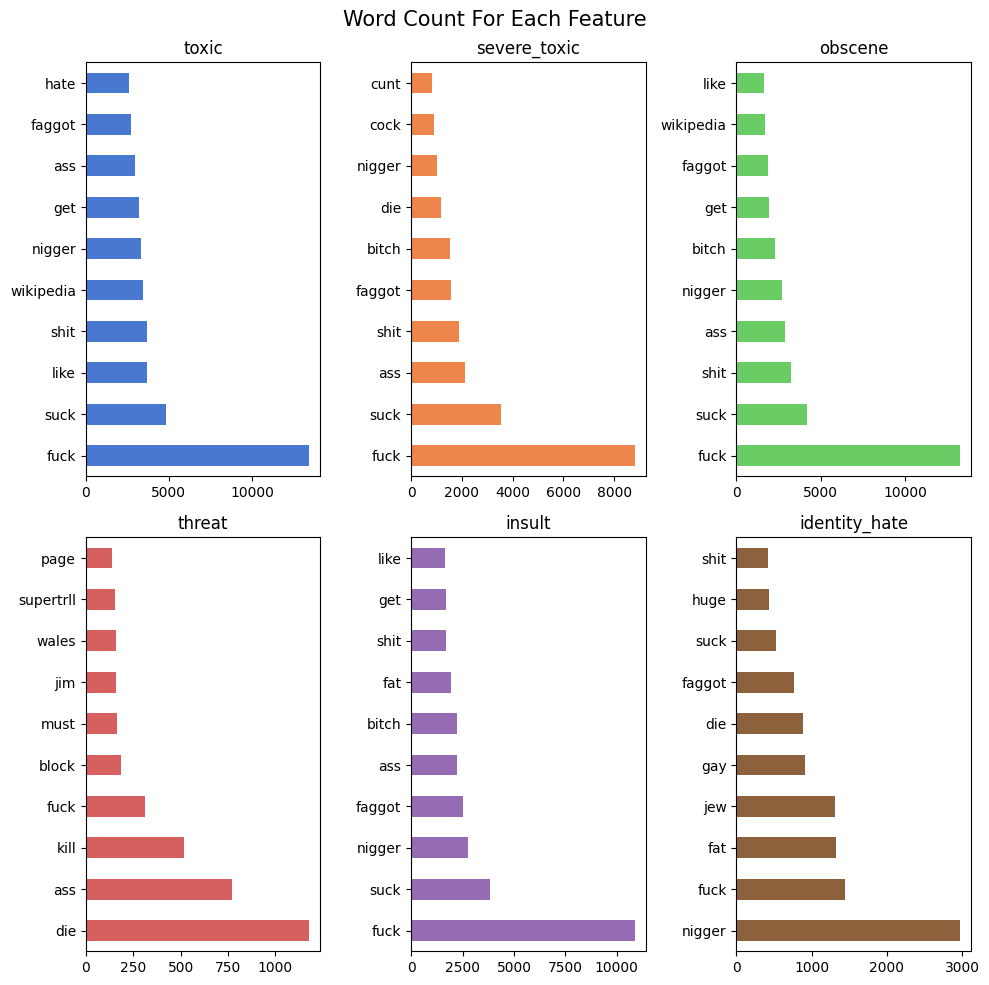

In [ ]:
from nltk.corpus import stopwords

stop_words = set(stopwords.words("english"))

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 10))
plt.suptitle("word count for each feature".title(), fontsize=15)

# To create a for-loop
for count, colax in enumerate(zip(df_train.columns[2:8], axes.flat)):
    cus = CountVectorizer(stop_words=stop_words, ngram_range=(1, 1), max_features=10000)
    cus.fit(df_train_copy.loc[df_train_copy[colax[0]] == 1, "cleaned_comment_text"])

    temp_df = pd.DataFrame(
        cus.transform(
            df_train_copy.loc[df_train_copy[colax[0]] == 1, "cleaned_comment_text"]
        ).todense(),
        columns=cus.get_feature_names_out(),
    )

    temp_df.sum().sort_values(ascending=False).head(10).plot(
        kind="barh", ax=colax[1], color=color_pal[count]
    )
    colax[1].set_title(colax[0])

plt.tight_layout()
plt.savefig("../charts/plots/word_count_for_each_feature.png", bbox_inches="tight")
plt.show()


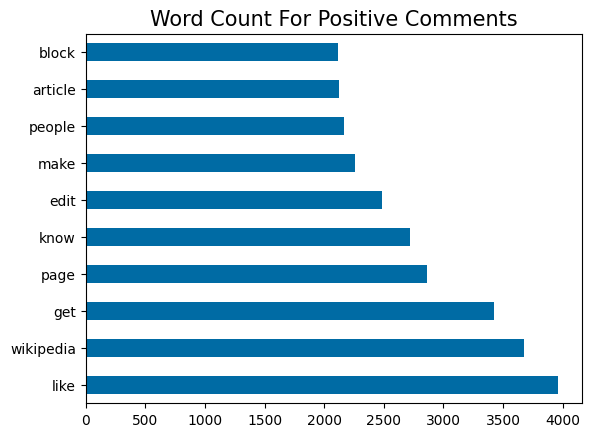

In [ ]:
from nltk.corpus import stopwords

stop_words = set(stopwords.words("english"))

cus = CountVectorizer(
    stop_words=stop_words, ngram_range=(1, 1), max_features=10000, min_df=0.01
)
cus.fit(
    df_train_negative.loc[df_train_negative["negative_sum"] == 0, "cleaned_comment_text"]
)

temp_df = pd.DataFrame(
    cus.transform(
        df_train_negative.loc[
            df_train_negative["negative_sum"] == 1, "cleaned_comment_text"
        ]
    ).todense(),
    columns=cus.get_feature_names_out(),
)

temp_df.sum().sort_values(ascending=False).head(10).plot(kind="barh")

plt.title("word count for positive comments".title(), fontsize=15)
plt.savefig("../charts/plots/word_count_for_positive_comments", bbox_inches="tight")
plt.show()


Bigrams


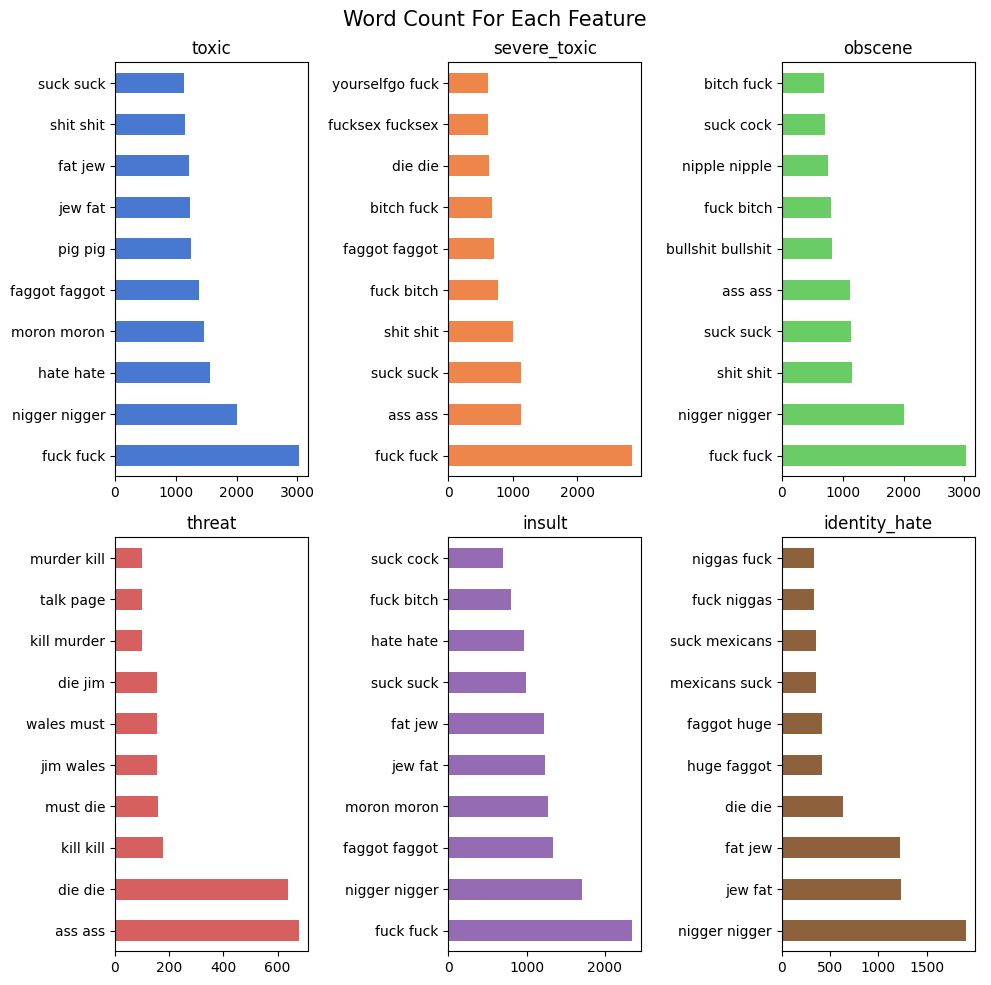

In [ ]:
from nltk.corpus import stopwords

stop_words = set(stopwords.words("english"))

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 10))
plt.suptitle("word count for each feature - bigrams".title(), fontsize=15)

# To create a for-loop
for count, colax in enumerate(zip(df_train.columns[2:8], axes.flat)):
    cus = CountVectorizer(stop_words=stop_words, ngram_range=(2, 2), max_features=10000)
    cus.fit(df_train_copy.loc[df_train_copy[colax[0]] == 1, "cleaned_comment_text"])

    temp_df = pd.DataFrame(
        cus.transform(
            df_train_copy.loc[df_train_copy[colax[0]] == 1, "cleaned_comment_text"]
        ).todense(),
        columns=cus.get_feature_names_out(),
    )

    temp_df.sum().sort_values(ascending=False).head(10).plot(
        kind="barh", ax=colax[1], color=color_pal[count]
    )
    colax[1].set_title(colax[0])

plt.tight_layout()
plt.savefig("../charts/plots/word_count_for_each_feature_bigram.png", bbox_inches="tight")
plt.show()


- With no surprise, we can see that the f-word is commonly seen through the negative comments in the dataset

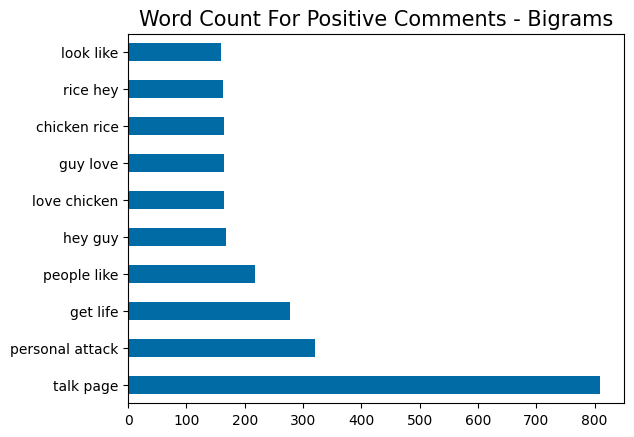

In [ ]:
from nltk.corpus import stopwords

stop_words = set(stopwords.words("english"))

cus = CountVectorizer(stop_words=stop_words, ngram_range=(2, 2), max_features=10000)
cus.fit(
    df_train_negative.loc[df_train_negative["negative_sum"] == 0, "cleaned_comment_text"]
)

temp_df = pd.DataFrame(
    cus.transform(
        df_train_negative.loc[
            df_train_negative["negative_sum"] == 1, "cleaned_comment_text"
        ]
    ).todense(),
    columns=cus.get_feature_names_out(),
)

temp_df.sum().sort_values(ascending=False).head(10).plot(kind="barh")

plt.title("word count for positive comments - bigrams".title(), fontsize=15)
plt.savefig("../charts/plots/word_count_for_positive_comments_bigram", bbox_inches="tight")
plt.show()


In [ ]:
df_train_copy.head()

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,cleaned_comment_text
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0,explanation why the edit make under username h...
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0,aww match this background colour seemingly sti...
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0,hey man really not try edit war just that this...
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0,more cannot make any real suggestions improvem...
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0,you sir hero any chance you remember what page...


In [ ]:
df_train_negative.head()

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,negative_sum,word_count,unique_word_count,upper_case_word_count,stop_word_count,punctuation_count,title_word_count,sentence_count,percent_unique_word_count,percent_upper_case_word_count,percent_punctuation_count,cleaned_comment_text
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0,0,43,41,2,20,10,11,5,95.348837,4.651163,23.255814,explanation why the edit make under username h...
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0,0,17,17,1,3,12,3,4,100.000000,5.882353,70.588235,aww match this background colour seemingly sti...
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0,0,42,39,0,21,6,2,4,92.857143,0.000000,14.285714,hey man really not try edit war just that this...
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0,0,113,82,5,58,21,7,6,72.566372,4.424779,18.584071,more cannot make any real suggestions improvem...
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0,0,13,13,0,6,5,2,3,100.000000,0.000000,38.461538,you sir hero any chance you remember what page...


## Saving the file


In [ ]:
# To save file
with open("../pickled_models/after_eda.pickle", "wb") as f:
    pickle.dump(df_train_negative, f)

# Split Modeling

As this is a mutli-label problem, there are 2 different steps taken to further explore on which modeling method is the best for this problem. 

The first method used is to split the features up individually, and then constructing a model for each feature. This is done to see if the model can predict the features individually.

This notebook details the steps taken to split the features up individually, and then constructing a model for each feature. This is done to see if the model can predict the features individually.

In [ ]:
# imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from itertools import cycle
import pickle
import scipy
import os

import nltk
from nltk.tokenize import sent_tokenize, word_tokenize, RegexpTokenizer
from nltk.corpus import stopwords
stop_words = set(stopwords.words("english"))
from nltk.stem import SnowballStemmer, WordNetLemmatizer
from nltk.stem import WordNetLemmatizer
from collections import Counter

from skmultilearn.model_selection import iterative_train_test_split

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB, ComplementNB
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, roc_auc_score, hamming_loss, confusion_matrix, average_precision_score, ConfusionMatrixDisplay, PrecisionRecallDisplay, RocCurveDisplay

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [ ]:
# Read in the pickle file

with open('../pickled_models/after_eda.pickle', 'rb') as f:
    df_train = pickle.load(f)

df_train.head()

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,non_toxic,word_count,unique_word_count,upper_case_word_count,stop_word_count,punctuation_count,title_word_count,sentence_count,percent_unique_word_count,percent_upper_case_word_count,percent_punctuation_count,cleaned_comment_text
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0,0,43,41,2,20,10,11,5,95.348837,4.651163,23.255814,explanation why the edit make under username h...
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0,0,17,17,1,3,12,3,4,100.000000,5.882353,70.588235,aww match this background colour seemingly sti...
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0,0,42,39,0,21,6,2,4,92.857143,0.000000,14.285714,hey man really not try edit war just that this...
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0,0,113,82,5,58,21,7,6,72.566372,4.424779,18.584071,more cannot make any real suggestions improvem...
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0,0,13,13,0,6,5,2,3,100.000000,0.000000,38.461538,you sir hero any chance you remember what page...


Tfidf Vectorizer has been chosen for the modeling

TF is the term frequency which works by looking at the frequency of the word in the document. This is similar to countvectorizer.
The second part IDF is the inverse document frequency which works by looking at the frequency of the word in the entire corpus. This is to reduce the weight of the word if it is too common in the corpus.If the word is too common, the IDF helps to minimize the weight of the word by taking the inverse.

This also helps to normalize the data.

## Function for modeling

In [ ]:
def gs(feature, pipe, pipe_params, filename, metric):

    """
    Function created to split the data into X and y, and then split the data into train and test sets.
    A gridsearch will then be conducted, and saving the best models according to the chosen metric in a pickle file.
    """

    X = df_train["cleaned_comment_text"]
    y = df_train[feature]

    # train test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=42, stratify=y
    )

    gs = GridSearchCV(pipe, param_grid=pipe_params, cv=3, scoring=metric, n_jobs=-1)

    gs.fit(X_train, y_train)

    with open(f"../pickled_models/{metric}/{filename}.pickle", "wb") as f:
        pickle.dump(gs, f)

In [ ]:
# Pipeline creation
tfidf_log_pipe = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words=stop_words)),
    ('lg', LogisticRegression())
])

tfidf_svc_pipe = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words=stop_words)),
    ('svc', LinearSVC())
])

tfidf_nb_pipe = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words=stop_words)),
    ('nb', ComplementNB())
])

In [ ]:
# params creation
tfidf_log_params = {
    'tfidf__max_features': [2000, 3000, 5000],
    'tfidf__min_df': [2, 3],
    'tfidf__max_df': [.9, .95],
    'tfidf__ngram_range': [(1,1), (1,2)],
    'lg__solver': ['liblinear'],
    'lg__C': [0.01, 0.1, 1, 10, 100],
    'lg__penalty': ['l1', 'l2'],
    'lg__max_iter': [1000,2000],
    'lg__class_weight': ['balanced']
}

tfidf_svc_params = {
    'tfidf__max_features': [2000, 3000, 5000],
    'tfidf__min_df': [2, 3],
    'tfidf__max_df': [.9, .95],
    'tfidf__ngram_range': [(1,1), (1,2)],
    'svc__C': [0.01,0.1 ,1, 10, 100],
    'svc__max_iter': [10_000],
    'svc__class_weight': ['balanced']
}

tfidf_nb_params = {
    'tfidf__max_features': [2000, 3000, 5000],
    'tfidf__min_df': [2, 3],
    'tfidf__max_df': [.9, .95],
    'tfidf__ngram_range': [(1,1), (1,2)],
    'nb__alpha': [0.01, 0.1, 1, 10, 100]
}

# Modeling

In [ ]:
# Putting the models into a dictionary

log_models = {
    'toxic': 'toxic_tfidf_log',
    'severe_toxic' : 'severe_toxic_tfidf_log',
    'obscene' : 'obscene_tfidf_log',
    'threat' : 'threat_tfidf_log',
    'insult' : 'insult_tfidf_log',
    'identity_hate' : 'identity_hate_tfidf_log'
}

nb_models = {
    'toxic': 'toxic_tfidf_nb',
    'severe_toxic' : 'severe_toxic_tfidf_nb',
    'obscene' : 'obscene_tfidf_nb',
    'threat' : 'threat_tfidf_nb',
    'insult' : 'insult_tfidf_nb',
    'identity_hate' : 'identity_hate_tfidf_nb'
}

svc_models = {
    'toxic': 'toxic_tfidf_svc',
    'severe_toxic' : 'severe_toxic_tfidf_svc',
    'obscene' : 'obscene_tfidf_svc',
    'threat' : 'threat_tfidf_svc',
    'insult' : 'insult_tfidf_svc',
    'identity_hate' : 'identity_hate_tfidf_svc'
}

In [ ]:
# Loop through the models and run the gridsearch
for k,v in svc_models.items():
    gs(feature=k, pipe=tfidf_svc_pipe, pipe_params=tfidf_svc_params, filename=v, metric='accuracy')

# Do not run - takes a long time

KeyboardInterrupt: 

In [ ]:
for k,v in log_models.items():
    gs(feature=k, pipe=tfidf_log_pipe, pipe_params=tfidf_log_params, filename=v, metric='accuracy')

# Do not run - takes a long time

In [ ]:
for k,v in nb_models.items():
    gs(feature=k, pipe=tfidf_nb_pipe, pipe_params=tfidf_nb_params, filename=v, metric='accuracy')

# Do not run - takes a long time

In [ ]:
# evaulation

# Function to plot confusion matrix and obtain the metrics into a dataframe

def results_extraction(feature="", model_name="", results={}, folder_name="", metric=""):

    '''
    Function to extract the pickle-ed model and to conduct predictions with X_test, saving the final results to a separate dataframe
    '''

    X = df_train["cleaned_comment_text"]
    y = df_train[feature]

    # train test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=42, stratify=y
    )

    # Extract the model
    filename = f'../pickled_models/{metric}/{model_name}.pickle'
    with open(filename, 'rb') as f:
        model = pickle.load(f)

        y_pred = model.predict(X_test)

    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    
    ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred), display_labels=[f'non-{feature}', feature]).plot(cmap='Blues')

    plt.title(f'{model_name}: Confusion Matrix')
    plt.savefig(f"../confusion_matrix/{folder_name}/{metric}/{model_name}_{metric}_confusion_matrix.png", bbox_inches='tight', facecolor='w')
    plt.close()

    # Different metrics
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    misclassification = 1 - accuracy
    recall = tp / (tp + fn)
    specificity = tn / (tn + fp)
    precision = tp / (tp + fp)
    f1 = 2 * (precision * recall) / (precision + recall)

    acc_diff = np.abs((model.score(X_train, y_train) - model.score(X_test, y_test))) / model.score(X_train, y_train)

    # Metrics for roc curve and auc
    # LinearSVC does not have predict proba - decision function will be used instead
    if "svc" not in model_name:
        pred_proba = model.predict_proba(X_test)[:,1]
        train_proba = model.predict_proba(X_train)[:,1]


    else:
        pred_proba = model.decision_function(X_test)
        train_proba = model.decision_function(X_train)

    pred_auc_score = roc_auc_score(y_test, pred_proba)
    train_auc_score = roc_auc_score(y_train, train_proba)
    pred_prc_score = average_precision_score(y_test, pred_proba)
    train_prc_score = average_precision_score(y_train, train_proba)
    auc_diff = np.abs((train_auc_score - pred_auc_score)) / train_auc_score
    prc_diff = np.abs((train_prc_score - pred_prc_score)) / train_prc_score


    # Append all above results to 'results' dictionary
    results[model_name] = [
        metric,
        model.best_params_,
        model.score(X_train, y_train),
        model.score(X_test, y_test),
        misclassification,
        recall,
        specificity,
        precision,
        f1,
        train_auc_score,
        pred_auc_score,
        train_prc_score,
        pred_prc_score,
        auc_diff,
        prc_diff,
        acc_diff
    ]

In [ ]:
results_log_acc = {}
for k,v in log_models.items():
    results_extraction(feature=k, model_name=v, results=results_log_acc, folder_name="logistic_regression", metric='accuracy')

results_nb_acc = {}
for k,v in nb_models.items():
    results_extraction(feature=k, model_name=v, results=results_nb_acc, folder_name="naive_bayes", metric='accuracy')

results_svc_acc = {}
for k,v in svc_models.items():
    results_extraction(feature=k, model_name=v, results=results_svc_acc, folder_name="linear_svc", metric='accuracy')

In [ ]:
# Create a dataframe for all results

def all_data(results_list=[], results_dict={}):
    '''
    Function to create a dataframe for all results
    '''
    for r in results_list:
            # pd.DataFrame()
        for k,v in r.items():
            results_dict[k] = v
        
    df = pd.DataFrame.from_dict(results_dict, orient='index', columns=['metric','best_params', 'train_acc_score', 'test_acc_score', 'misclassification', 'recall', 'specificity', 'precision', 'f1', 'train_auc', 'pred_auc', 'train_prc', 'pred_prc', 'auc_diff', 'prc_diff', 'acc_diff'])
    
    return df

# Gridsearch with different metrics

As the dataset is imbalanced, and we want to predict the minority class. Normally we would use the F1 score as the metric. However, we want to see how the model performs on the 

In [ ]:
for k,v in log_models.items():
    gs(feature=k, pipe=tfidf_log_pipe, pipe_params=tfidf_log_params, filename=v, metric='average_precision')

/home/bryan/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/bryan/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/bryan/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/bryan/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [ ]:
for k,v in nb_models.items():
    gs(feature=k, pipe=tfidf_nb_pipe, pipe_params=tfidf_nb_params, filename=v, metric='average_precision')

In [ ]:
for k,v in svc_models.items():
    gs(feature=k, pipe=tfidf_svc_pipe, pipe_params=tfidf_svc_params, filename=v, metric='average_precision')

/home/bryan/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/bryan/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/bryan/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/bryan/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/bryan/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/bryan/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to 

In [ ]:
results_log_prc = {}
for k,v in log_models.items():
    results_extraction(feature=k, model_name=v, results=results_log_prc, folder_name="logistic_regression", metric='average_precision')

results_nb_prc = {}
for k,v in nb_models.items():
    results_extraction(feature=k, model_name=v, results=results_nb_prc, folder_name="naive_bayes", metric='average_precision')

results_svc_prc = {}
for k,v in svc_models.items():
    results_extraction(feature=k, model_name=v, results=results_svc_prc, folder_name="linear_svc", metric='average_precision')

In [ ]:
results_list_acc = [
    results_log_acc,
    results_nb_acc,
    results_svc_acc,
]

results_list_prc = [
    results_log_prc,
    results_nb_prc,
    results_svc_prc,
]

acc_final_results = all_data(results_list=results_list_acc, results_dict={})
prc_final_results = all_data(results_list=results_list_prc, results_dict={})

In [ ]:
final_results = pd.concat([acc_final_results.reset_index(), prc_final_results.reset_index()], axis=0, ignore_index=True)
final_results.head()

,index,metric,best_params,train_acc_score,test_acc_score,misclassification,recall,specificity,precision,f1,train_auc,pred_auc,train_prc,pred_prc,auc_diff,prc_diff,acc_diff
0,toxic_tfidf_log,accuracy,"{'lg__C': 0.01, 'lg__class_weight': 'balanced'...",0.936741,0.936497,0.063503,0.623147,0.969712,0.685612,0.652889,0.892947,0.889222,0.699938,0.697111,0.004172,0.004039,0.000260
1,severe_toxic_tfidf_log,accuracy,"{'lg__C': 10, 'lg__class_weight': 'balanced', ...",0.975667,0.969962,0.030038,0.828810,0.971388,0.226469,0.355735,0.994854,0.973030,0.549261,0.406304,0.021937,0.260272,0.005847
2,obscene_tfidf_log,accuracy,"{'lg__C': 0.01, 'lg__class_weight': 'balanced'...",0.975882,0.976479,0.023521,0.773964,0.987802,0.780119,0.777030,0.955473,0.954688,0.817800,0.814554,0.000822,0.003969,0.000612
3,threat_tfidf_log,accuracy,"{'lg__C': 100, 'lg__class_weight': 'balanced',...",0.999472,0.993650,0.006350,0.419580,0.995370,0.213523,0.283019,0.999942,0.949330,0.963691,0.202867,0.050615,0.789489,0.005825
4,insult_tfidf_log,accuracy,"{'lg__C': 0.01, 'lg__class_weight': 'balanced'...",0.962292,0.960833,0.039167,0.734236,0.972599,0.581824,0.649205,0.936402,0.931655,0.650390,0.635588,0.005070,0.022758,0.001516


In [ ]:
# Saving the final results into a pickle file
with open('../pickled_models/final_split_results.pickle', 'wb') as f:
    pickle.dump(final_results, f)

In [ ]:
with open("../pickled_models/final_split_results.pickle", "rb") as f:
    final_results = pickle.load(f)

# Precision Recall Curve

In [ ]:
# Function to plot the prc and auc curves


def plot_prc(models_list, metrics, model_type):
    '''
    Function to plot the prc curves for all features
    '''
    # setup plot details
    colors = cycle(sns.color_palette("Set2", 10))

    _, ax = plt.subplots(figsize=(7, 8))

    f_scores = np.linspace(0.2, 0.8, num=4)
    lines, labels = [], []
    for f_score in f_scores:
        x = np.linspace(0.01, 1)
        y = f_score * x / (2 * x - f_score)
        (l,) = plt.plot(x[y >= 0], y[y >= 0], color="gray", alpha=0.2)
        plt.annotate("f1={0:0.1f}".format(f_score), xy=(0.9, y[45] + 0.02))

    for k, v in models_list.items():
        X = df_train["cleaned_comment_text"]
        y = df_train[k]

        # train test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.3, random_state=42, stratify=y
        )
        filename = f"../pickled_models/{metrics}/{k}_tfidf_{model_type}.pickle"
        with open(filename, "rb") as f:
            model = pickle.load(f)
        display = PrecisionRecallDisplay.from_estimator(model, X_test, y_test, name=k)
        plt.close()
        display.plot(ax=ax, color=next(colors), name=k)

    # add the legend for the iso-f1 curves
    # handles, labels = display.ax_.get_legend_handles_labels()
    # handles.extend([l])
    # labels.extend(["iso-f1 curves"])
    # set the legend and the axes
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.legend(loc="best", bbox_to_anchor=(1.05, 1))
    ax.set_title(f"{metrics} - Precision-Recall curve - {model_type}".title())
    plt.savefig(f"../charts/model_plots/{metrics}_prc_{model_type}.png", bbox_inches="tight")

    plt.show()

In [ ]:

def plot_roc(models_list, metrics, model_type):
    '''
    Function to plot roc curve for all features
    '''
    # setup plot details
    colors = cycle(sns.color_palette("Set2", 10))

    _, ax = plt.subplots(figsize=(7, 8))

    for k, v in models_list.items():
        X = df_train["cleaned_comment_text"]
        y = df_train[k]

        # train test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.3, random_state=42, stratify=y
        )
        filename = f"../pickled_models/{metrics}/{k}_tfidf_{model_type}.pickle"
        with open(filename, "rb") as f:
            model = pickle.load(f)
        display = RocCurveDisplay.from_estimator(model, X_test, y_test, name=k)
        plt.close()
        display.plot(ax=ax, color=next(colors), name=k)


    # set the legend and the axes
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.legend(loc="best", bbox_to_anchor=(1.05, 1))
    ax.set_title(f"{metrics} - ROC curve - {model_type}".title())
    plt.savefig(f"../charts/model_plots/{metrics}_roc_{model_type}.png", bbox_inches="tight")

    plt.show()

## Accuracy Metric Plots

In [ ]:
dict_models = {
    'log_models' : 'log',
    'nb_models' : 'nb',
    'svc_models' : 'svc'
}

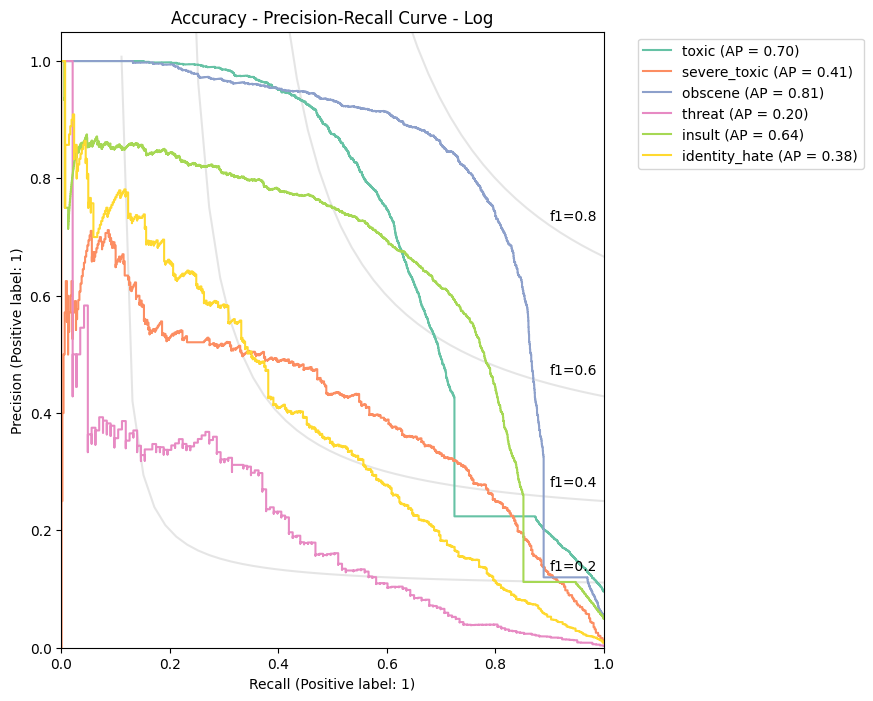

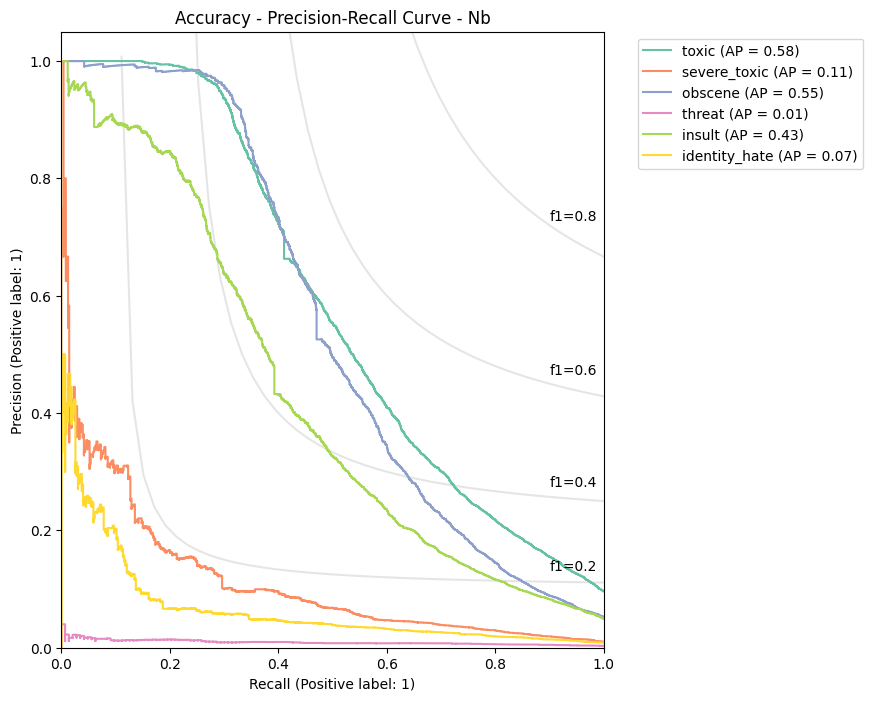

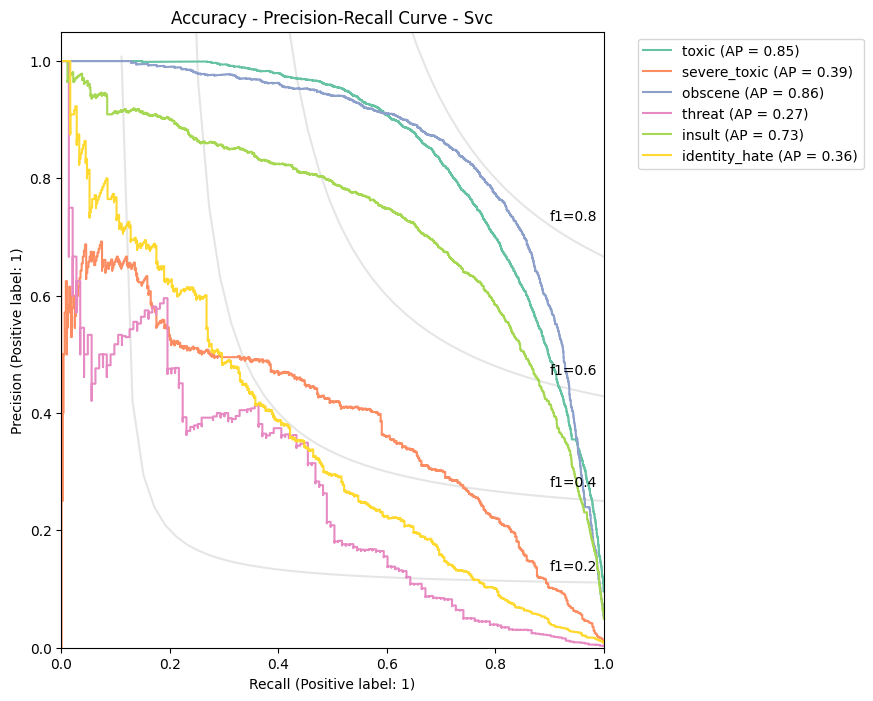

In [ ]:
# Prc curve - for models that are tuned to maximize accuracy
for k,v in dict_models.items():
    plot_prc(models_list=eval(k), metrics='accuracy', model_type=v)

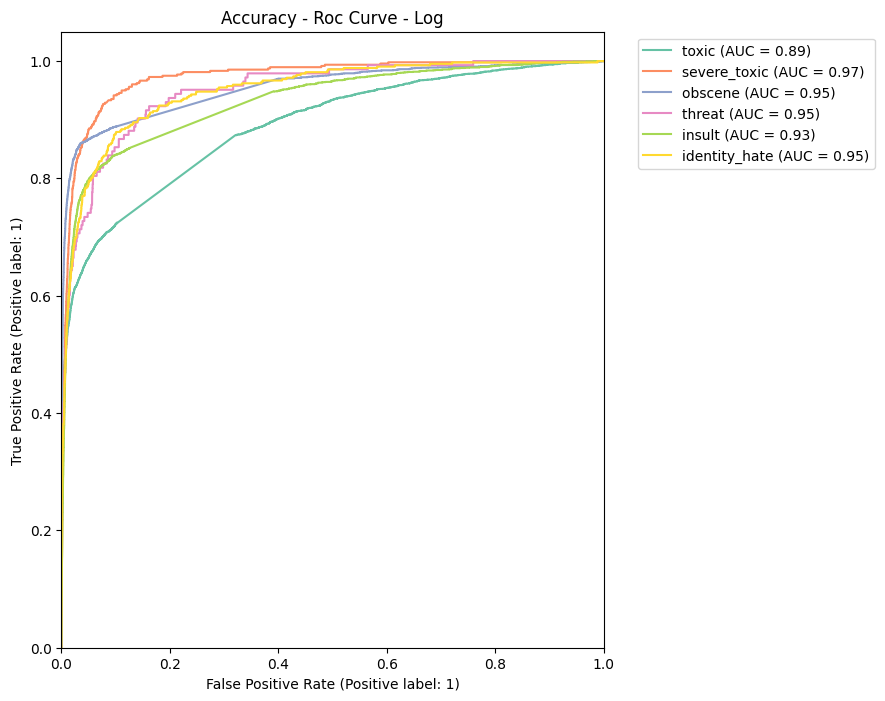

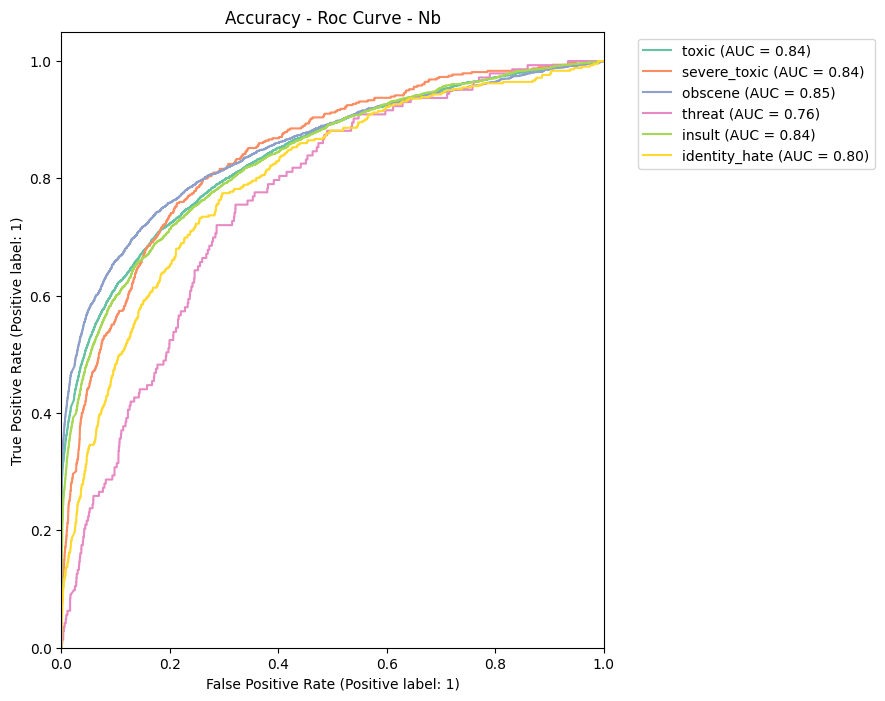

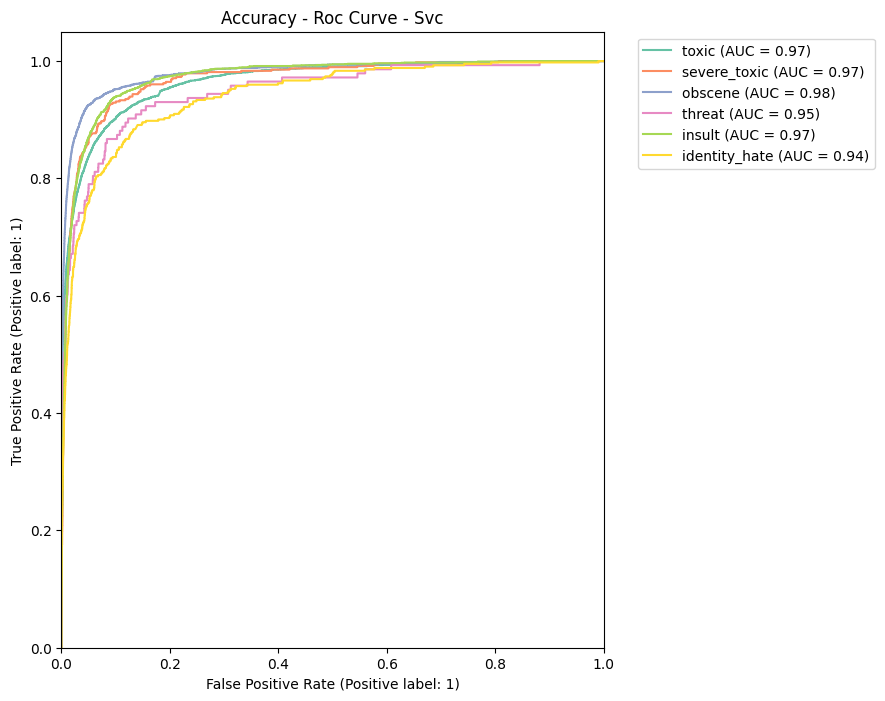

In [ ]:
# Roc curve - for models that are tuned to maximize accuracy
for k,v in dict_models.items():
    plot_roc(models_list=eval(k), metrics='accuracy', model_type=v)

## Average Precision Plots

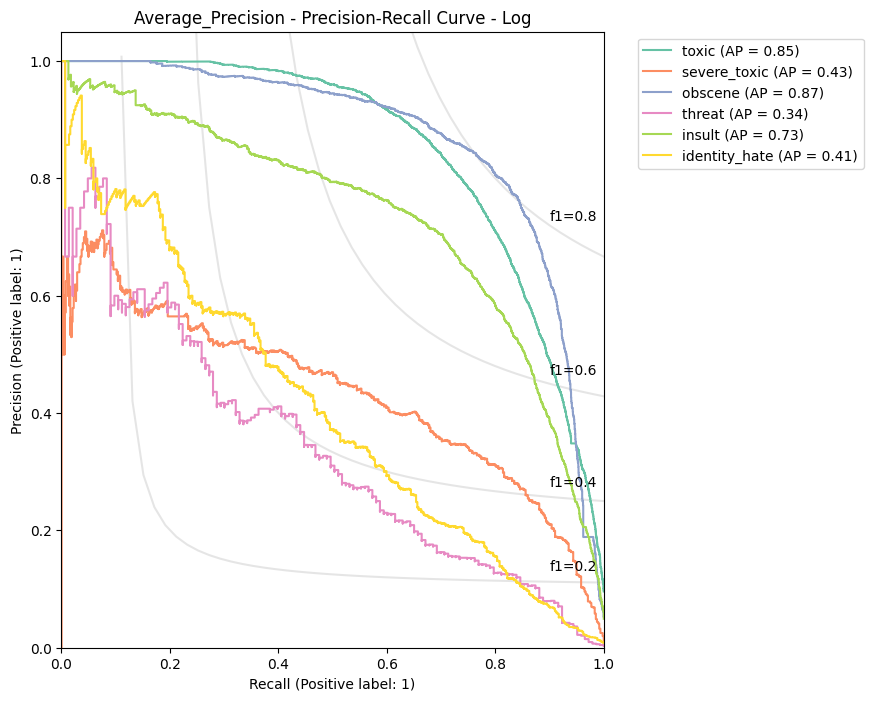

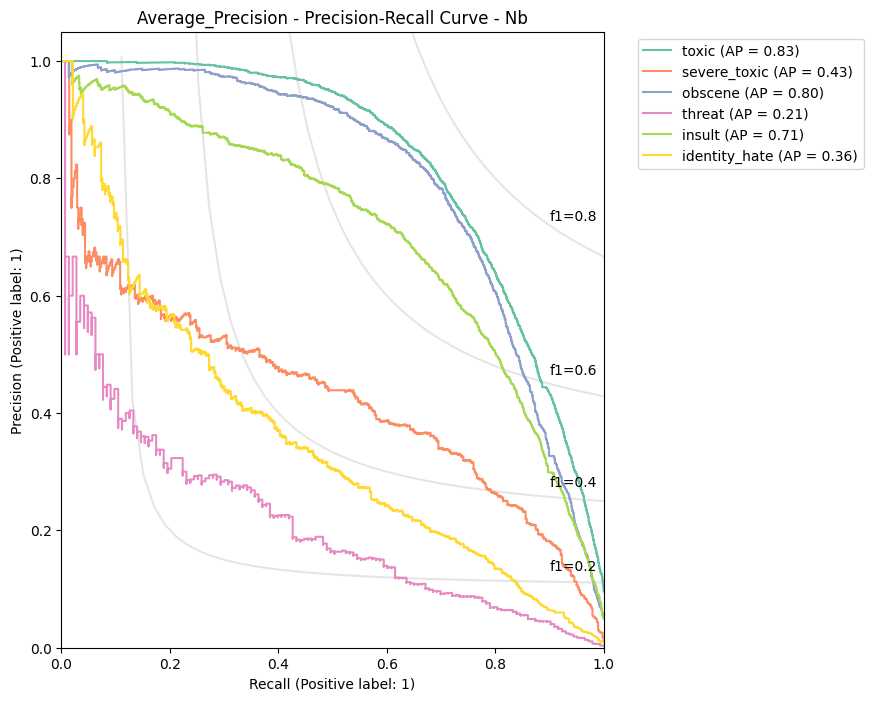

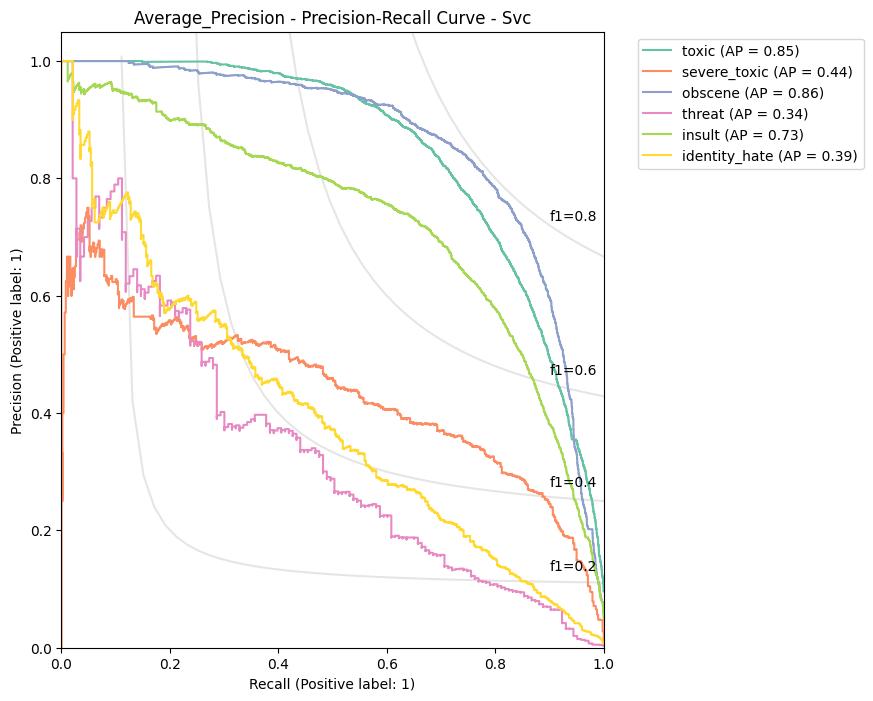

In [ ]:
# Prc curve - for models that are tuned to maximize average_precision
for k,v in dict_models.items():
    plot_prc(models_list=eval(k), metrics='average_precision', model_type=v)

In [ ]:
# final_results.query("index.str.contains('svc')", engine='python')

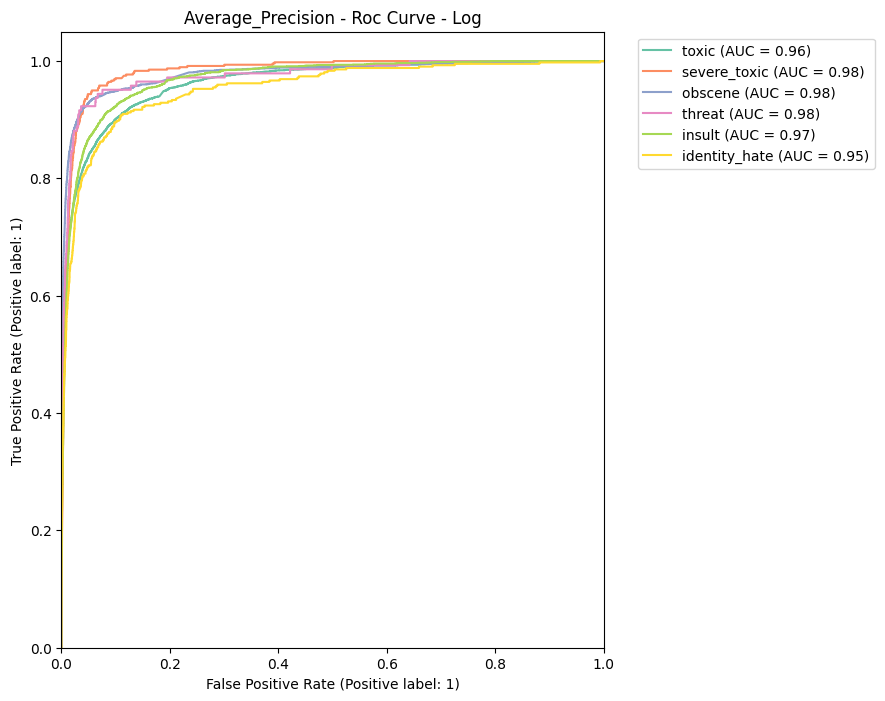

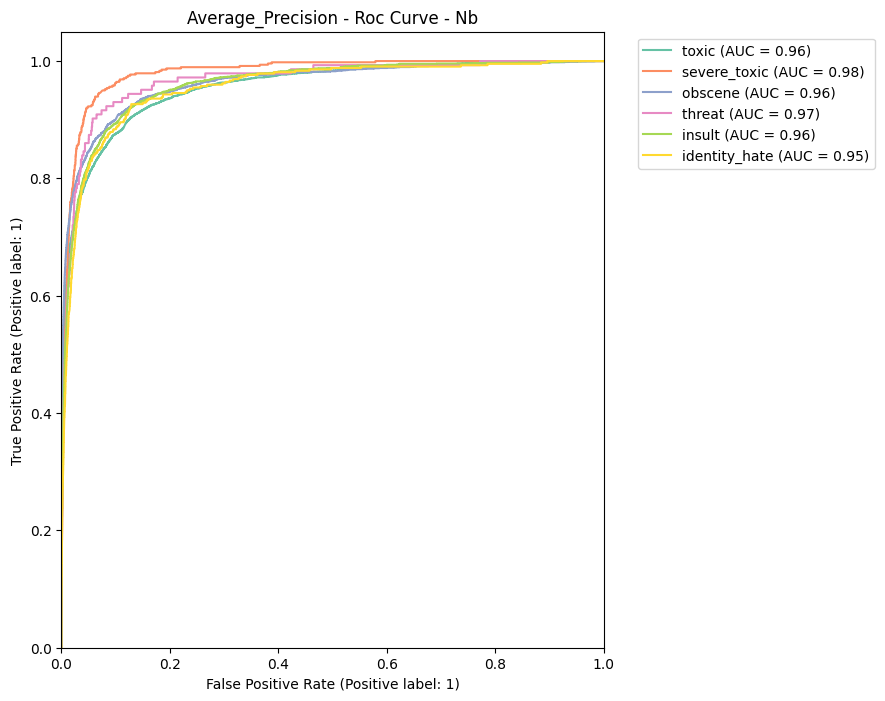

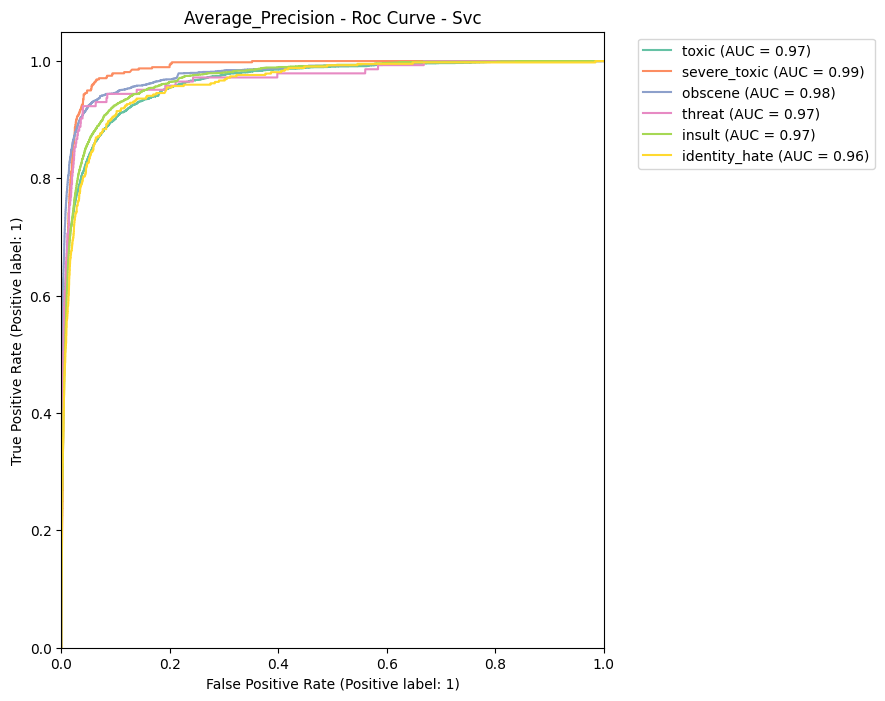

In [ ]:
# Roc curve - for models that are tuned to maximize average_precision
for k,v in dict_models.items():
    plot_roc(models_list=eval(k), metrics='average_precision', model_type=v)

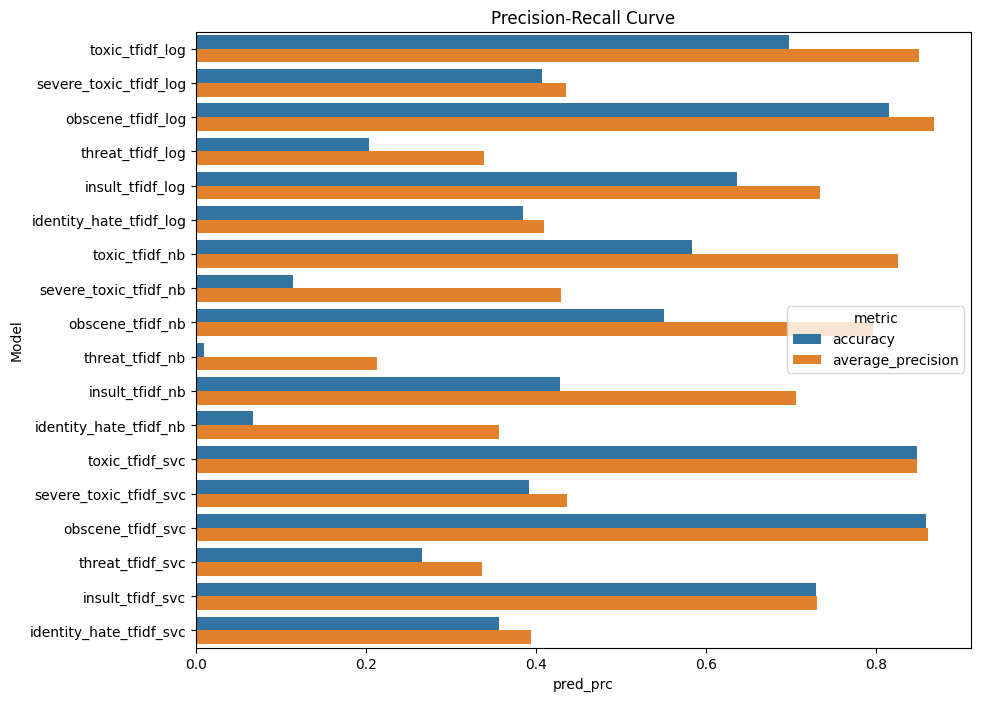

In [ ]:
# final_results.query("metric == 'accuracy'")['pred_prc'].plot(kind='bar', figsize=(10,8), title='Accuracy - Precision-Recall Curve')

plt.figure(figsize=(10,8))

sns.barplot(y='index', x='pred_prc', hue='metric', data=final_results)

plt.ylabel('Model')
plt.title('Precision-Recall Curve')
plt.savefig('../charts/model_plots/overall_prc.png', bbox_inches='tight')
plt.show()